# Load

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.image as mpimg
import matplotlib.font_manager as fm

import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.formula.api as sm
from statsmodels.stats.anova import anova_lm
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

OUTPUT_DIR = 'output/'

In [10]:
fm._get_fontconfig_fonts.cache_clear()
font_path = 'assets/Tungsten Font/Tungsten-Bold/Tungsten-Bold.ttf'

# Load the custom font
custom_font = fm.FontProperties(fname=font_path, size=40,)
axis_labels_font = fm.FontProperties(family="Noto Sans", size=13)
plt.rcParams['font.family'] = custom_font.get_name()
plt.rcParams['font.size'] = 26  # Change to your desired font size

In [11]:
df = pd.read_csv(OUTPUT_DIR + 'df_all.csv')

print(df.shape)
display(df.head())

(240795, 33)


,stats_score,stats_kills,stats_deaths,stats_assists,stats_headshots,stats_bodyshots,stats_legshots,stats_damage_dealt,stats_damage_received,ability_casts_grenade,...,total_rounds,KDA Ratio,ADR,ACS,Overall Ability Cast,Win Ratio,damage_per_kills,queue_id_numeric,map_name_numeric,agent_name_numeric
0,-0.373784,-0.418093,0.856048,0.503302,-0.081188,-0.578460,-0.901913,-0.344157,1.354924,0.243616,...,0.79319,-0.551241,-0.719950,-0.731170,0.688671,-0.215257,0.112991,0,5,1
1,0.828314,0.752924,0.856048,0.800652,1.192798,-0.516386,0.068347,0.802564,0.643662,0.042060,...,0.79319,0.127553,0.442102,0.471817,-1.252211,0.274613,-0.176264,0,5,4
2,-0.067874,0.083771,1.104480,-0.091399,-0.991177,0.787160,2.655705,-0.221738,0.682217,1.553728,...,0.79319,-0.551241,-0.595894,-0.425034,1.076847,-0.215257,-0.757141,0,5,7
3,1.052361,0.920212,0.856048,-1.280799,0.646804,-0.454312,-0.255073,0.816910,0.960074,-0.461829,...,0.79319,-0.381543,0.456640,0.696029,-0.669947,-0.215257,-0.422546,0,5,2
4,0.139554,0.251059,0.110753,-0.686099,-0.081188,0.414718,1.038606,0.036489,-0.111472,-0.361052,...,0.79319,-0.251773,-0.334214,-0.217452,0.300494,0.274613,-0.582370,0,5,1


#Label Decoding

In [12]:
agent_dict = {
    'Omen': 0,
    'Sova': 1,
    'Jett': 2,
    'Chamber': 3,
    'Reyna': 4,
    'Killjoy': 5,
    'Astra': 6,
    'Cypher': 7,
    'Neon': 8,
    'Gekko': 9,
    'Clove': 10,
    'Vyse': 11,
    'Skye': 12,
    'Iso': 13,
    'Yoru': 14,
    'Raze': 15,
    'Phoenix': 16,
    'Deadlock': 17,
    'Harbor': 18,
    'KAY/O': 19,
    'Viper': 20,
    'Sage': 21,
    'Brimstone': 22,
    'Fade': 23,
    'Breach': 24
}
reversed_agent_dict = {v: k for k, v in agent_dict.items()}
df['agent_name'] = df['agent_name_numeric'].astype(int).map(reversed_agent_dict)

agent_roles = {
    0: "Controller",
    1: "Initiators",
    2: "Duelists",
    3: "Sentinels",
    4: "Duelists",
    5: "Sentinels",
    6: "Controller",
    7: "Sentinels",
    8: "Duelists",
    9: "Initiators",
    10: "Controller",
    11: "Sentinels",
    12: "Initiators",
    13: "Duelists",
    14: "Duelists",
    15: "Duelists",
    16: "Duelists",
    17: "Sentinels",
    18: "Controller",
    19: "Initiators",
    20: "Controller",
    21: "Sentinels",
    22: "Controller",
    23: "Initiators",
    24: "Initiators"
}

agent_color = {
    "Controller" : "#ff2832",
    "Initiators" : "#2eb387",
    "Duelists" : "#fec54d",
    "Sentinels" : "#84594b"
}
reversed_agent_roles = {v: k for k, v in agent_roles.items()}
df['agent_role'] = df['agent_name_numeric'].astype(int).map(agent_roles)

map_dict = {
    'Abyss': 0,
    'Split': 1,
    'Haven': 2,
    'Bind': 3,
    'Pearl': 4,
    'Ascent': 5,
    'Sunset': 6,
    'Fracture': 7,
    'Icebox': 8,
    'Lotus': 9,
    'Breeze': 10
}
reversed_map_dict = {v: k for k, v in map_dict.items()}
df['map_name'] = df['map_name_numeric'].astype(int).map(reversed_map_dict)

df.columns


Index(['stats_score', 'stats_kills', 'stats_deaths', 'stats_assists',
       'stats_headshots', 'stats_bodyshots', 'stats_legshots',
       'stats_damage_dealt', 'stats_damage_received', 'ability_casts_grenade',
       'ability_casts_ability1', 'ability_casts_ability2',
       'ability_casts_ultimate', 'tier_id', 'account_level',
       'economy_spent_overall', 'economy_spent_average',
       'economy_loadout_value_overall', 'economy_loadout_value_average',
       'total_plants', 'total_defuses', 'rounds_won', 'rounds_lost',
       'total_rounds', 'KDA Ratio', 'ADR', 'ACS', 'Overall Ability Cast',
       'Win Ratio', 'damage_per_kills', 'queue_id_numeric', 'map_name_numeric',
       'agent_name_numeric', 'agent_name', 'agent_role', 'map_name'],
      dtype='object')

#Frequencies

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/2293546633.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks()*100, fontproperties=axis_labels_font, color='#98A2AD',)


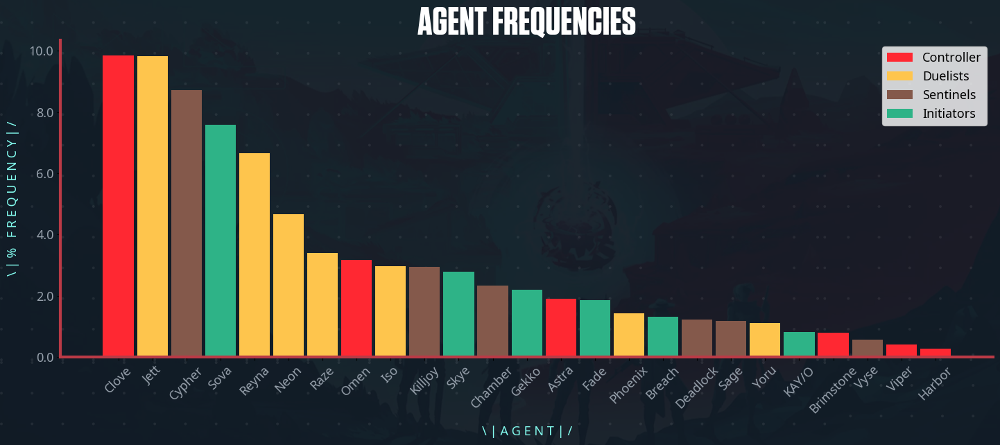

In [13]:
agent_counts = df['agent_name'].value_counts(normalize=True)


img = mpimg.imread("assets/wide_background.png")

fig, ax = plt.subplots(figsize=(15, 7))
ax.set_facecolor((0,0,0,0))
fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)


# plt.figure(figsize=(10, 6))


agent_categories = [agent_roles[agent_dict[agent]] for agent in agent_counts.index]
agent_colors = [agent_color[agent] for agent in agent_categories]
bars = plt.bar(agent_counts.index, agent_counts.values, color=agent_colors,width=0.9)

category_legend = {}
for bar, category in zip(bars, agent_categories):
    x, y = bar.get_x(), bar.get_height()
    if category not in category_legend:
        category_legend[category] = bar.set_label(category)

ax.spines['top'].set_color('#ba3a46')
ax.spines['top'].set_alpha(0)
ax.spines['bottom'].set_color('#ba3a46')
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_color('#ba3a46')
ax.spines['left'].set_linewidth(3)
ax.spines['right'].set_color('#ba3a46')
ax.spines['right'].set_linewidth(0)

plt.xlabel(' '.join('\|AGENT|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.ylabel(' '.join('\|% FREQUENCY|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

plt.title('Agent Frequencies'.upper(), fontproperties=custom_font, color='white')
plt.xticks(rotation=45, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )
ax.set_yticklabels(ax.get_yticks()*100, fontproperties=axis_labels_font, color='#98A2AD',)
plt.legend(prop=axis_labels_font)

plt.tight_layout()

*   Top 4 used agents are from different agent roles.
* Caution for data interpretations given the unbalanced use of agents.

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/2283703032.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


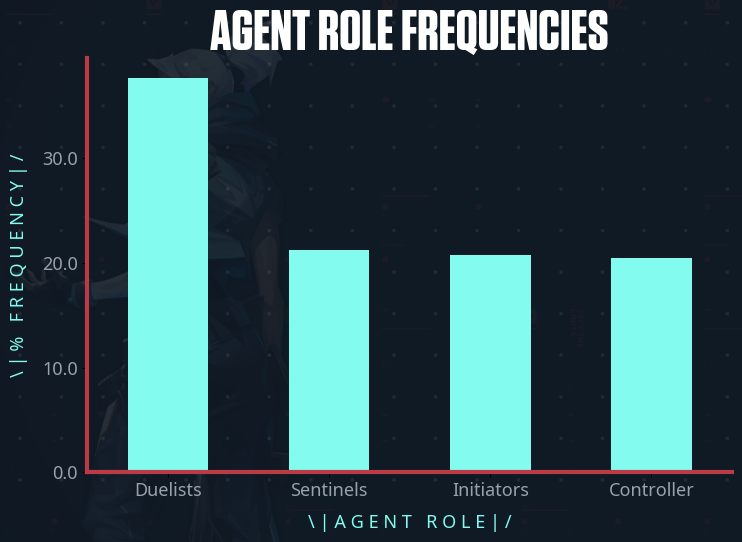

In [14]:
agent_counts = df['agent_role'].value_counts(normalize=True)
# plt.figure(figsize=(10, 6))

img = mpimg.imread("assets/generic_background.png")

fig, ax = plt.subplots(figsize=(8, 6))
ax.set_facecolor((0,0,0,0))
fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

ax.spines['top'].set_color('#ba3a46')
ax.spines['top'].set_alpha(0)
ax.spines['bottom'].set_color('#ba3a46')
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_color('#ba3a46')
ax.spines['left'].set_linewidth(3)
ax.spines['right'].set_color('#ba3a46')
ax.spines['right'].set_linewidth(0)

agent_counts.plot(kind='bar', color='#83FCEF')
# plt.title('Agent Role Frequencies')
plt.xlabel('Agent Role')
plt.ylabel('Frequency')
# plt.xticks(rotation=45, ha='right')

plt.xlabel(' '.join('\|Agent Role|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.ylabel(' '.join('\|% FREQUENCY|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

plt.title('Agent Role Frequencies'.upper(), fontproperties=custom_font, color='white')
plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )
ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
# plt.legend(prop=axis_labels_font)


plt.tight_layout()

More duelists found in the dataset compared to other roles. Could be from the fact that there are more duelist agents to begin with.

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/1719924297.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


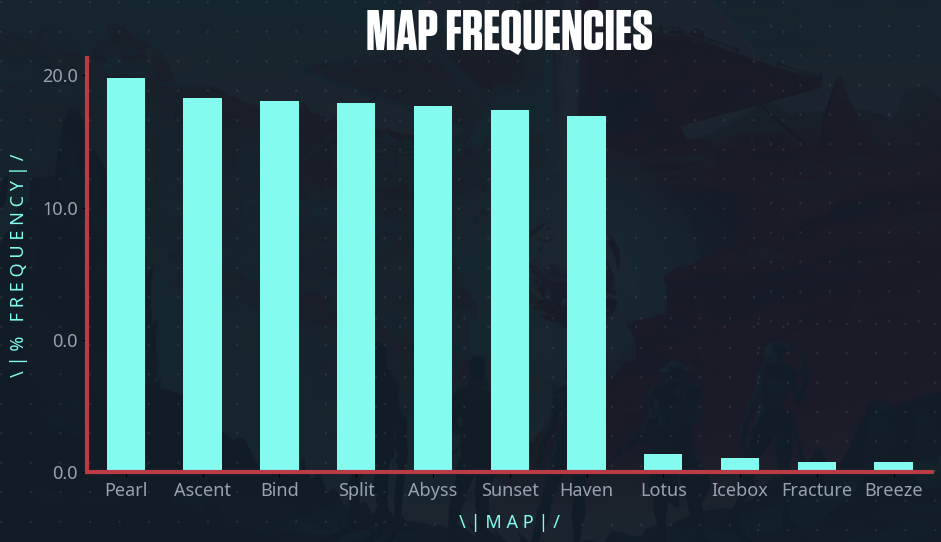

In [15]:
agent_counts = df['map_name'].value_counts(normalize=True)


img = mpimg.imread("assets/semiwide_background.png")

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_facecolor((0,0,0,0))
fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

ax.spines['top'].set_color('#ba3a46')
ax.spines['top'].set_alpha(0)
ax.spines['bottom'].set_color('#ba3a46')
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_color('#ba3a46')
ax.spines['left'].set_linewidth(3)
ax.spines['right'].set_color('#ba3a46')
ax.spines['right'].set_linewidth(0)

# plt.figure(figsize=(10, 6))
agent_counts.plot(kind='bar', color='#83FCEF')


plt.xlabel(' '.join('\|Map|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.ylabel(' '.join('\|% FREQUENCY|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

plt.title('Map Frequencies'.upper(), fontproperties=custom_font, color='white')
plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )

ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
plt.tight_layout()

First seven maps having similar frequencies shows that the map randomization is fair. The last 4 is due to its omission in competitive games.

#Principal Component Analysis

In [16]:
# Get features to be included in the analysis
X = df.iloc[:,:-6]
X.columns

Index(['stats_score', 'stats_kills', 'stats_deaths', 'stats_assists',
       'stats_headshots', 'stats_bodyshots', 'stats_legshots',
       'stats_damage_dealt', 'stats_damage_received', 'ability_casts_grenade',
       'ability_casts_ability1', 'ability_casts_ability2',
       'ability_casts_ultimate', 'tier_id', 'account_level',
       'economy_spent_overall', 'economy_spent_average',
       'economy_loadout_value_overall', 'economy_loadout_value_average',
       'total_plants', 'total_defuses', 'rounds_won', 'rounds_lost',
       'total_rounds', 'KDA Ratio', 'ADR', 'ACS', 'Overall Ability Cast',
       'Win Ratio', 'damage_per_kills'],
      dtype='object')

In [17]:
X.shape

(240795, 30)

In [18]:
# Checking for highly correlated features

correlation_matrix = X.corr()

highly_correlated_pairs = set()
for feature1 in correlation_matrix.columns:
    for feature2 in correlation_matrix.index:
        if feature1 != feature2 and correlation_matrix.loc[feature1, feature2] >= 0.8:
            pair = tuple(sorted((feature1, feature2)))
            highly_correlated_pairs.add(pair)

for pair in highly_correlated_pairs:
    print(f"{pair[0]} and {pair[1]}: {correlation_matrix.loc[pair[0], pair[1]]:.2f}")

economy_spent_overall and total_rounds: 0.88
stats_damage_received and stats_deaths: 0.94
stats_damage_dealt and stats_kills: 0.95
ACS and stats_kills: 0.88
economy_loadout_value_overall and total_rounds: 0.90
ADR and stats_kills: 0.85
stats_kills and stats_score: 0.98
economy_spent_overall and stats_damage_received: 0.81
stats_damage_dealt and stats_score: 0.98
ACS and stats_score: 0.88
stats_headshots and stats_kills: 0.84
ADR and stats_score: 0.86
economy_loadout_value_overall and economy_spent_overall: 0.84
ACS and ADR: 0.97
stats_damage_dealt and stats_headshots: 0.85
stats_headshots and stats_score: 0.84
ACS and stats_damage_dealt: 0.84
ADR and stats_damage_dealt: 0.87
Win Ratio and rounds_won: 0.85


Highly correlated features are examined to see potential relationships that can be combined in the principal components.

In [19]:
# PCA proper
pca = PCA()
X_pca = pca.fit_transform(X)

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4070280579.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks().astype(int), fontproperties=axis_labels_font, color='#98A2AD', )
/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4070280579.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1), fontproperties=axis_labels_font, color='#98A2AD',)


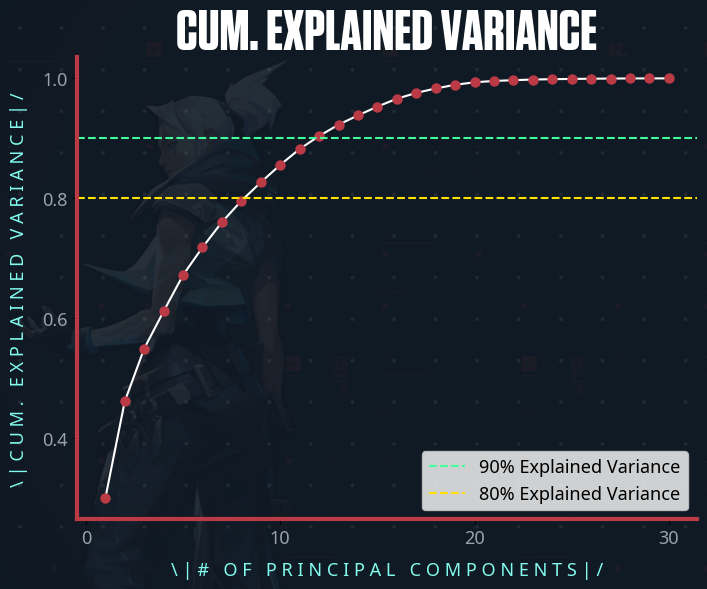

Number of components for 90% variance: 12
Number of components for 80% variance: 9


In [20]:
# Cumulative Variance Explained


img = mpimg.imread("assets/generic_background.png")

fig, ax = plt.subplots(figsize=(8, 6))
ax.set_facecolor((0,0,0,0))
fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

ax.spines['top'].set_color('#ba3a46')
ax.spines['top'].set_alpha(0)
ax.spines['bottom'].set_color('#ba3a46')
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_color('#ba3a46')
ax.spines['left'].set_linewidth(3)
ax.spines['right'].set_color('#ba3a46')
ax.spines['right'].set_linewidth(0)

cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
ax.plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance,  marker='o', color='#ffffff',
          markerfacecolor='#ba3a46', 
          markeredgecolor='#ba3a46',
          markeredgewidth=1.5)


plt.title('CUM. Explained Variance'.upper(), fontproperties=custom_font, color='white')

# plt.title('Cumulative Explained Variance Plot')
plt.xlabel(' '.join('\|# of Principal Components|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.ylabel(' '.join('\|Cum. Explained Variance|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.axhline(y=0.9, color='#41ff9d', linestyle='--', label='90% Explained Variance')
plt.axhline(y=0.8, color='#ffe100', linestyle='--', label='80% Explained Variance')


ax.set_xticklabels(ax.get_xticks().astype(int), fontproperties=axis_labels_font, color='#98A2AD', )
ax.set_yticklabels(ax.get_yticks().round(1), fontproperties=axis_labels_font, color='#98A2AD',)


plt.legend(prop=axis_labels_font)
plt.show()
n_components_90 = np.argmax(cumulative_variance >= 0.9) + 1
print(f"Number of components for 90% variance: {n_components_90}")
n_components_80 = np.argmax(cumulative_variance >= 0.8) + 1
print(f"Number of components for 80% variance: {n_components_80}")

The cumulative variance explained chart shows that 9-12 principal components are needed to explain 80%-90% of the variability in the data.

In [21]:
!rm -rf /Users/francismarkcayco/.matplotlib

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/1499508505.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks().astype(int), fontproperties=axis_labels_font, color='#98A2AD', )
/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/1499508505.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1), fontproperties=axis_labels_font, color='#98A2AD',)


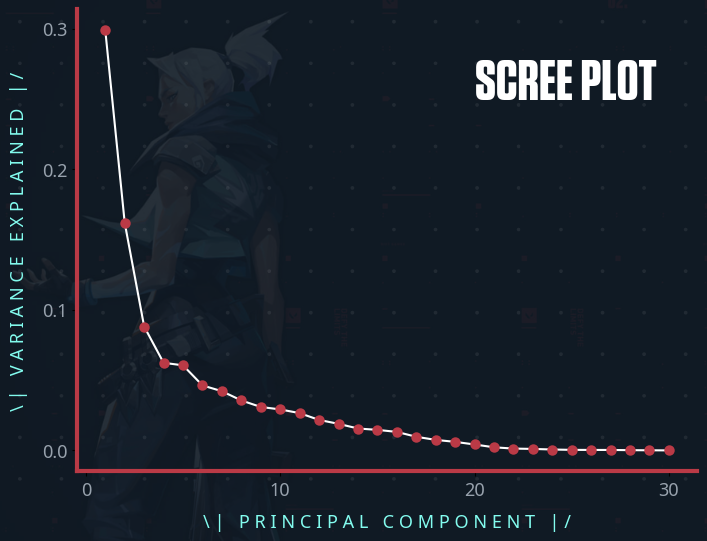

In [22]:
# Scree Plot


img = mpimg.imread("assets/generic_background.png")

fig, ax = plt.subplots(figsize=(8, 6))
ax.set_facecolor((0,0,0,0))
fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

# ax.imshow(img, extent=[30, 1, 0, 2], aspect='auto')

ax.spines['top'].set_color('#ba3a46')
ax.spines['top'].set_alpha(0)
ax.spines['bottom'].set_color('#ba3a46')
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_color('#ba3a46')
ax.spines['left'].set_linewidth(3)
ax.spines['right'].set_color('#ba3a46')
ax.spines['right'].set_linewidth(0)

plt.plot(np.arange(1, len(pca.explained_variance_ratio_) + 1), 
         pca.explained_variance_ratio_, 
         marker='o', color='#ffffff',
          markerfacecolor='#ba3a46', 
          markeredgecolor='#ba3a46',
          markeredgewidth=1.5
         )

ax.set_xticklabels(ax.get_xticks().astype(int), fontproperties=axis_labels_font, color='#98A2AD', )
ax.set_yticklabels(ax.get_yticks().round(1), fontproperties=axis_labels_font, color='#98A2AD',)


ax.text(20, 0.25,'SCREE PLOT', fontproperties=custom_font, color='white')
plt.xlabel(' '.join('\| Principal Component |/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.ylabel(' '.join('\| Variance Explained |/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
plt.show()

However, in the scree plot, 6 would be reasonable visually. It only explains 71.8% of the variability.

In [23]:
# Table of Eigenvalues and Variance Explained
scree_df = pd.DataFrame({
    'Principal Component': range(1, pca.n_components_ + 1),
    'Eigenvalue': pca.explained_variance_,
    'Explained Variance Ratio': pca.explained_variance_ratio_,
    'Cumulative Explained Variance': pca.explained_variance_ratio_.cumsum()
})

print(scree_df.to_string(index=False))

 Principal Component  Eigenvalue  Explained Variance Ratio  Cumulative Explained Variance
                   1    8.976718                  0.298831                       0.298831
                   2    4.861449                  0.161835                       0.460666
                   3    2.647059                  0.088119                       0.548786
                   4    1.871882                  0.062314                       0.611100
                   5    1.818220                  0.060528                       0.671627
                   6    1.388843                  0.046234                       0.717861
                   7    1.265254                  0.042120                       0.759981
                   8    1.067656                  0.035542                       0.795523
                   9    0.928257                  0.030901                       0.826424
                  10    0.876107                  0.029165                       0.855589
          

Following the Kaiser Criterion, there should be 8 PCs with eigenvalues greater than 1. This gives 79.5% of explained variability. This strikes a balance between the cumulative variance and scree plot methods.

In [24]:
num_pc = 8
cumulative_variance_at_num_pc = cumulative_variance[num_pc - 1]
print(f"Cumulative variance at {num_pc} PCs: {cumulative_variance_at_num_pc*100:.4f}")

Cumulative variance at 8 PCs: 79.5523


In [25]:
pca_final = PCA(n_components=num_pc)
X_pca_final = pca_final.fit_transform(X)

pc_df = pd.DataFrame(data=X_pca_final, columns=[f'PC{i}' for i in range(1, num_pc+1)])

df2 = pd.concat([X, df.iloc[:, -6:], pc_df], axis=1)

In [26]:
df2.columns

Index(['stats_score', 'stats_kills', 'stats_deaths', 'stats_assists',
       'stats_headshots', 'stats_bodyshots', 'stats_legshots',
       'stats_damage_dealt', 'stats_damage_received', 'ability_casts_grenade',
       'ability_casts_ability1', 'ability_casts_ability2',
       'ability_casts_ultimate', 'tier_id', 'account_level',
       'economy_spent_overall', 'economy_spent_average',
       'economy_loadout_value_overall', 'economy_loadout_value_average',
       'total_plants', 'total_defuses', 'rounds_won', 'rounds_lost',
       'total_rounds', 'KDA Ratio', 'ADR', 'ACS', 'Overall Ability Cast',
       'Win Ratio', 'damage_per_kills', 'queue_id_numeric', 'map_name_numeric',
       'agent_name_numeric', 'agent_name', 'agent_role', 'map_name', 'PC1',
       'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'],
      dtype='object')

In [27]:
df2.shape


(240795, 44)

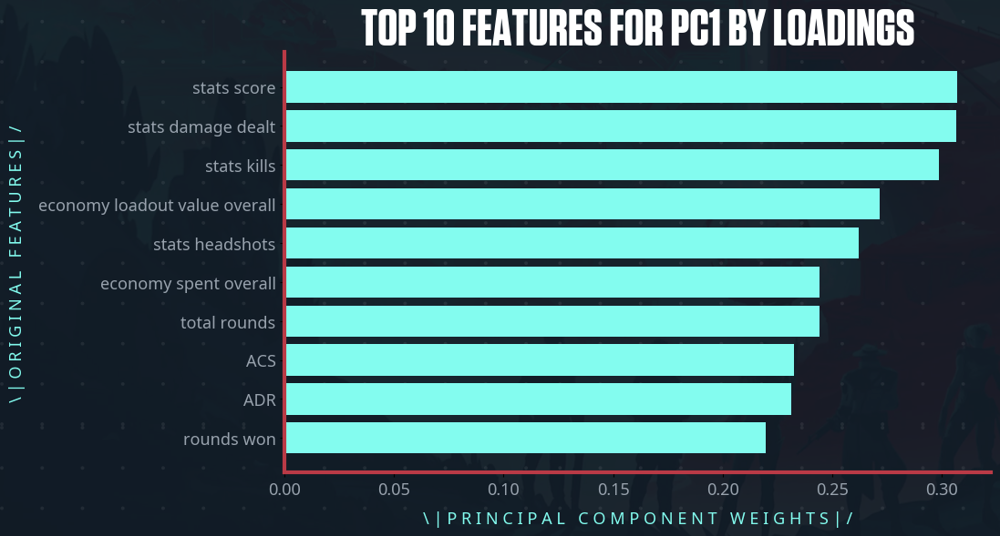

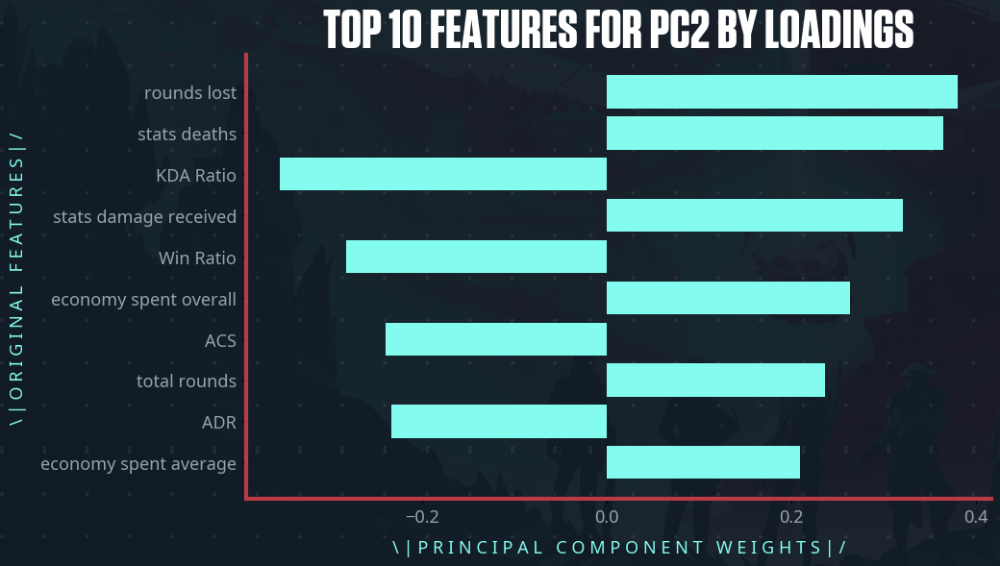

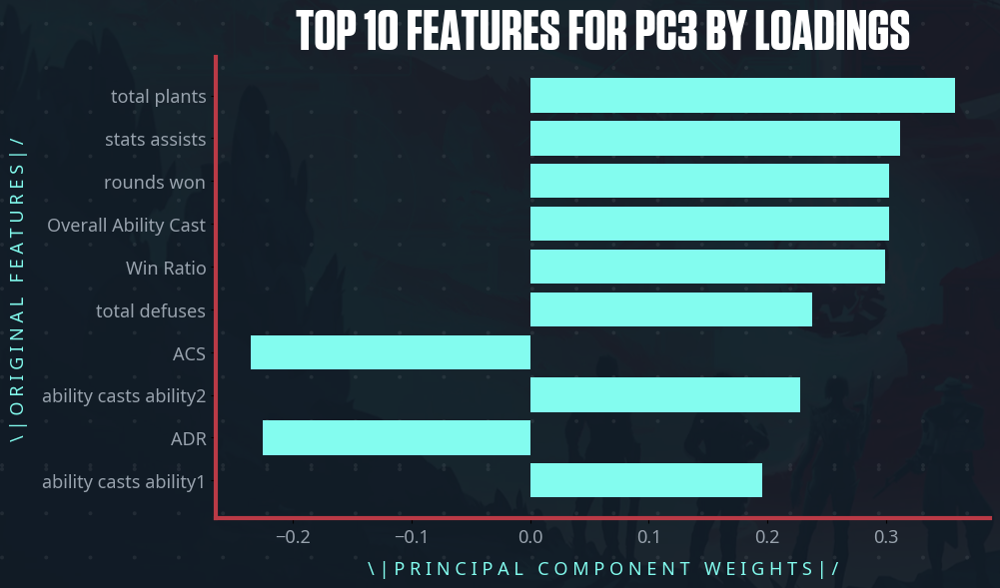

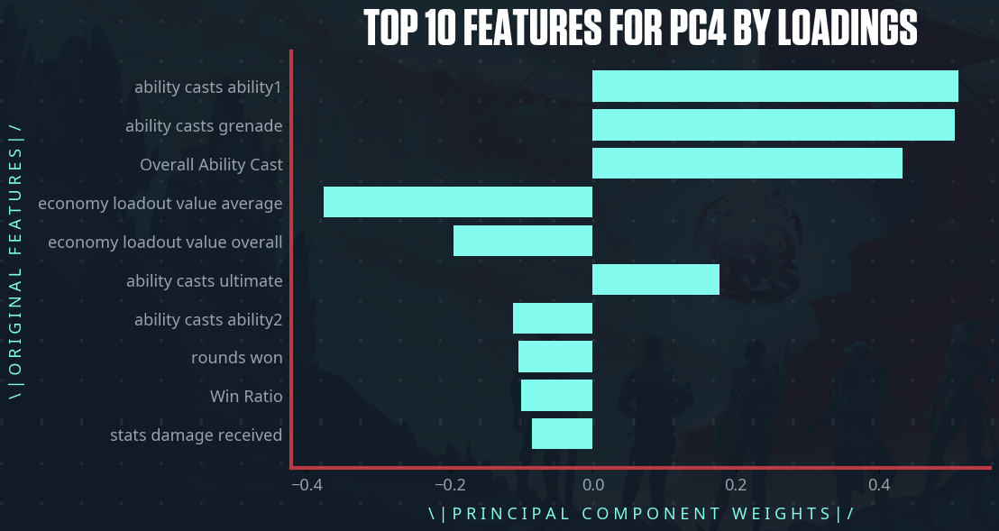

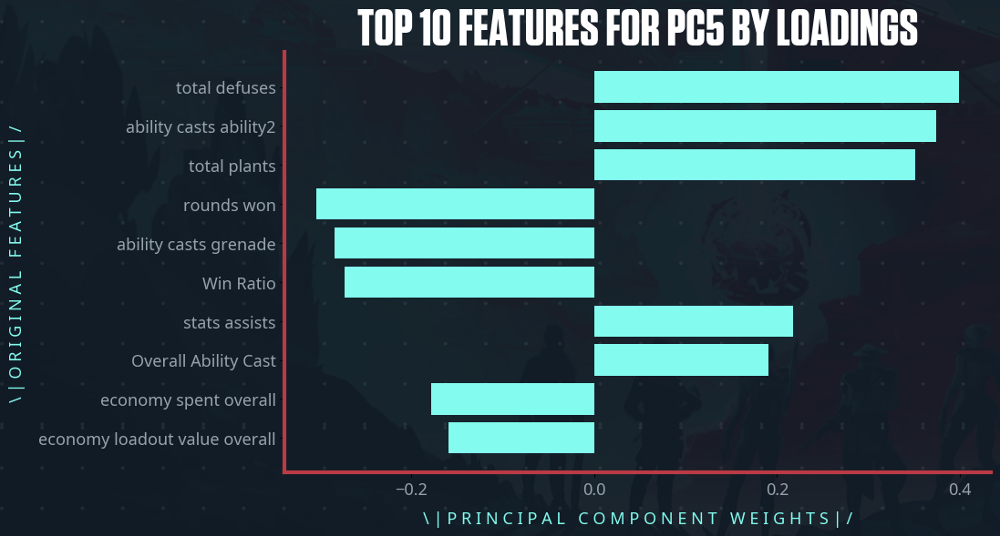

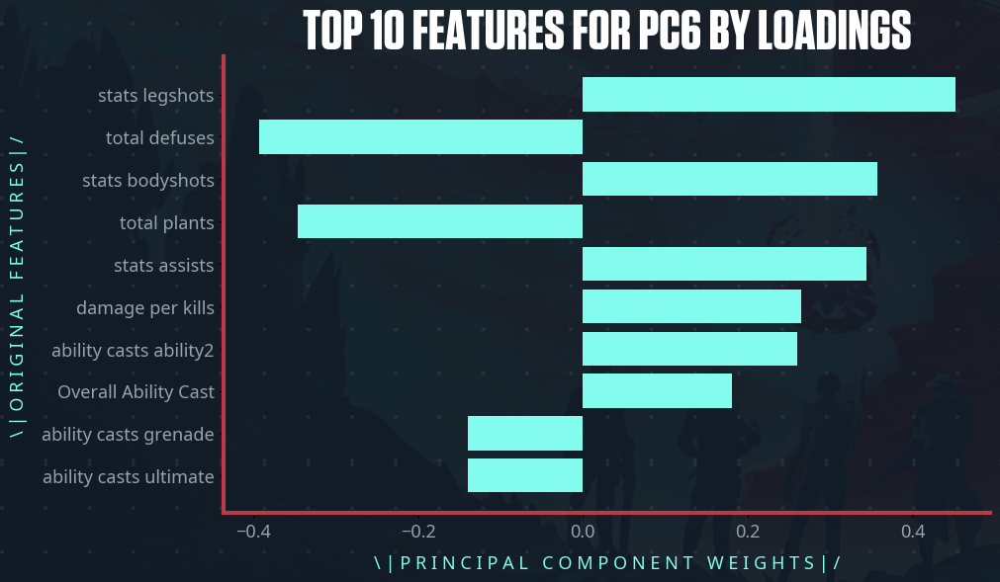

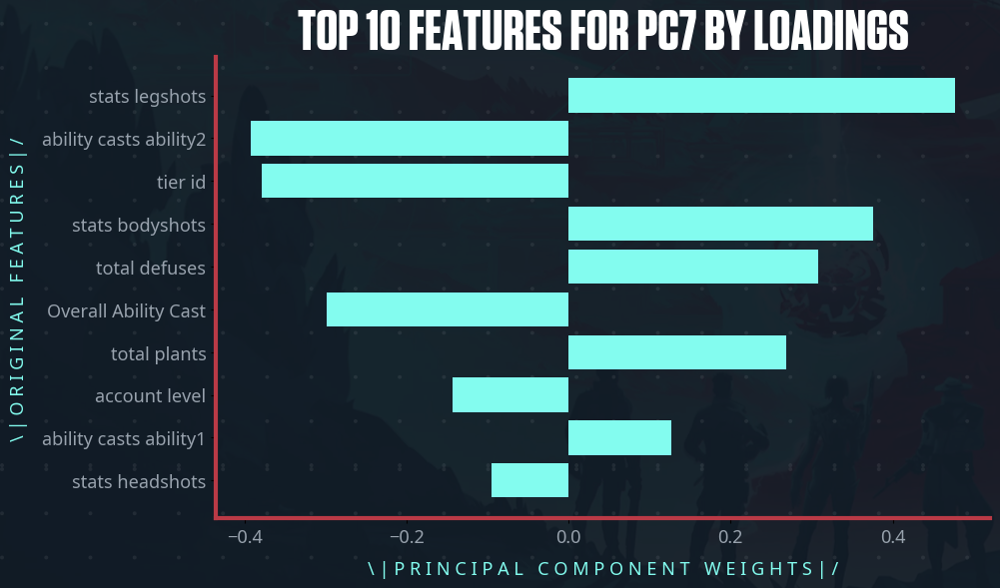

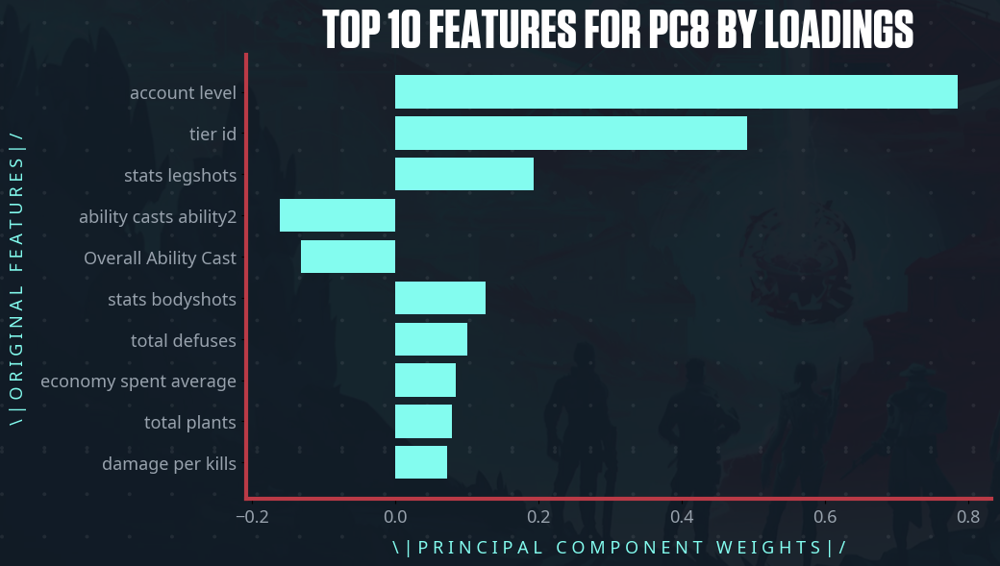

In [28]:
# Plots for top 10 features per PC
num_features = X.shape[1]
feature_names = X.columns

for i in range(1, num_pc+1):
    img = mpimg.imread("assets/wide_background.png")

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_facecolor((0,0,0,0))
    fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

    ax.spines['top'].set_color('#ba3a46')
    ax.spines['top'].set_alpha(0)
    ax.spines['bottom'].set_color('#ba3a46')
    ax.spines['bottom'].set_linewidth(3)
    ax.spines['left'].set_color('#ba3a46')
    ax.spines['left'].set_linewidth(3)
    ax.spines['right'].set_color('#ba3a46')
    ax.spines['right'].set_linewidth(0)

    loadings = pca_final.components_[i - 1]
    sorted_indices = np.argsort(np.abs(loadings))[-10:]
    sorted_loadings = loadings[sorted_indices]
    sorted_feature_names = feature_names[sorted_indices]

    sorted_feature_names = [ name.replace('_',' ') for name in sorted_feature_names]

    plt.barh(sorted_feature_names, sorted_loadings, color='#83FCEF')
    plt.xlabel(' '.join('\|Principal Component Weights|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    plt.ylabel(' '.join('\|Original Features|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

    plt.title(f'Top {len(sorted_feature_names)} Features for PC{i} by loadings'.upper(), fontproperties=custom_font, color='white')

    plt.yticks(fontproperties=axis_labels_font, color='#98A2AD',)
    plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )
    plt.show()

Some findings:
- PC1 seems to be more on the positive performace with high kills, damage dealt, economy usage, and rounds one. This could be an agressive play style that leads to victories. We will call this PC `Combat Prowess` to emphasize the skill and effectiveness in combat.
- PC2 deals more on rounds lost, deaths, and damage received, while being negatively impacted by the KDA and win ratios. This seems like a losing component attributed to getting damaged in-game. We will call this PC `Fragility Factor` for its susceptability to damage and negative outcomes.
- PC3 has the objective of planting the spike grouped with number of assists and ability usage which could indicate some supportive plays that lead to securing the planting of the spike. We will call it `Utility-Based Teamwork` to highlight role of utility in facilitating teamwork and achieving objectives.
- PC4 is characterized by high ability usage across various types, coupled with lower spending on weapons and a negative impact on win ratio. This suggests a playstyle that prioritizes abilities over traditional gunplay, potentially at the cost of consistent victories. We will call this PC `Ability Focus`.
- PC5 highlights players who prioritize both planting and defusing the Spike, utilizing abilities strategically to achieve these objectives. However, it also reflects a tendency towards unconventional strategies that may not always result in wins. This is because simply planting the Spike doesn't guarantee victory; the opposing team still has the opportunity to defuse.  We call this PC `Calculated Objective Play` to emphasize the strategic focus on both sides of objective play, acknowledging the complex relationship between these actions and winning.
- PC6 displays a pattern of strong gunplay with high leg and body shots, coupled with consistent assists and varied ability usage.  Plants and defuses have negative loadings here. This suggests a playstyle focused on supporting the team through consistent damage and enabling kills, rather than directly securing objectives. We'll call this PC `Gunfire Support` to emphasize this supportive role through their firearm skills.
- PC7 demonstrates a playstyle where gun skills are directly used to facilitate objective-based actions. The positive loadings for plants and defuses and strong indicators of gunplay like leg and body shots, suggest players who actively use their weapons to create opportunities to plant or defuse the Spike. We'll call this PC `Objective-Focused Gunplay` to capture this direct link between firearm skills and achieving in-game goals.
- PC8 is dominated by "account_level" and "tier_id," clearly indicating that this component captures elements related to player experience and rank within the game. This suggests that PC8 may represent a progression axis, where higher scores correlate with more experienced players who have reached higher ranks.  While some minor loadings on gunplay and ability usage exist, they are secondary to the overwhelming emphasis on player level and tier. We'll call this PC `Player Progression` to reflect this central theme.

In [29]:
pc_names = {
    1: "Combat Prowess",
    2: "Fragility Factor",
    3: "Utility-Based Teamwork",
    4: "Ability Focus",
    5: "Calculated Objective Play",
    6: "Gunfire Support",
    7: "Objective-Focused Gunplay",
    8: "Player Progression"
}

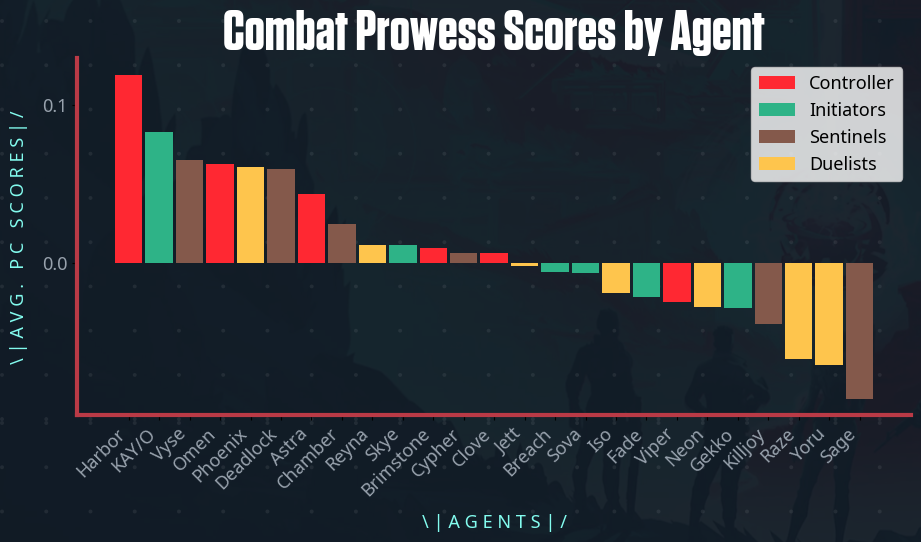

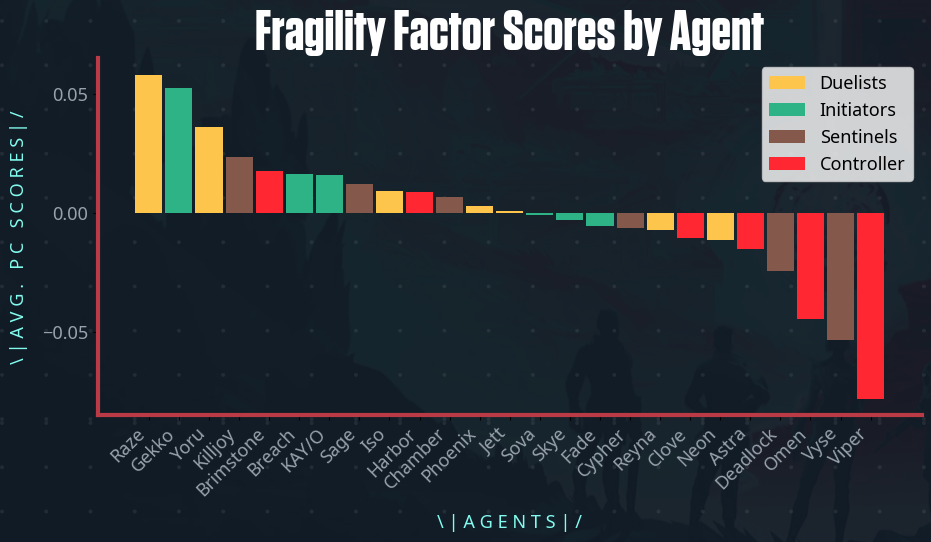

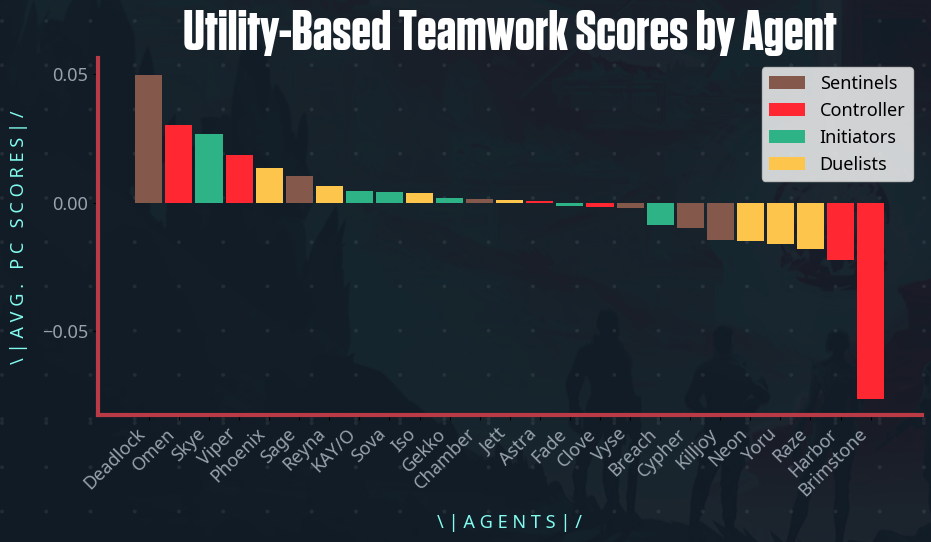

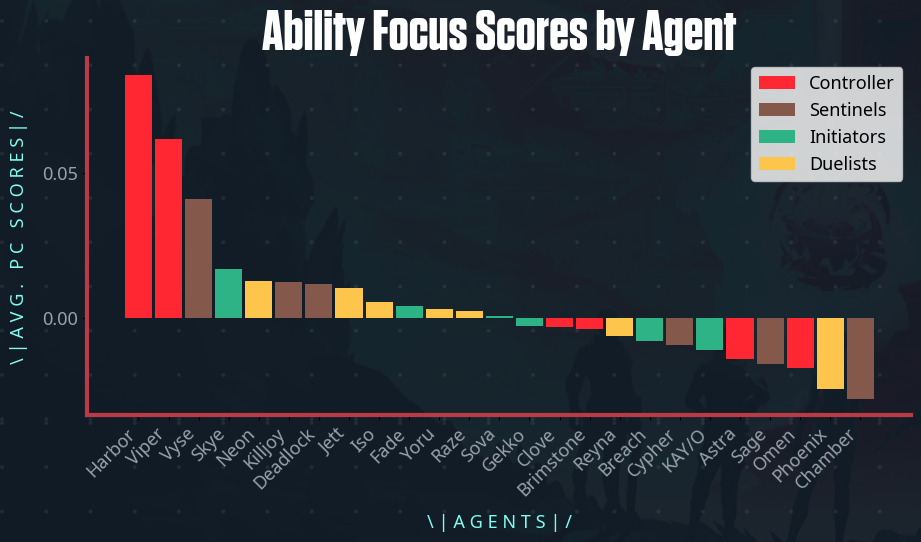

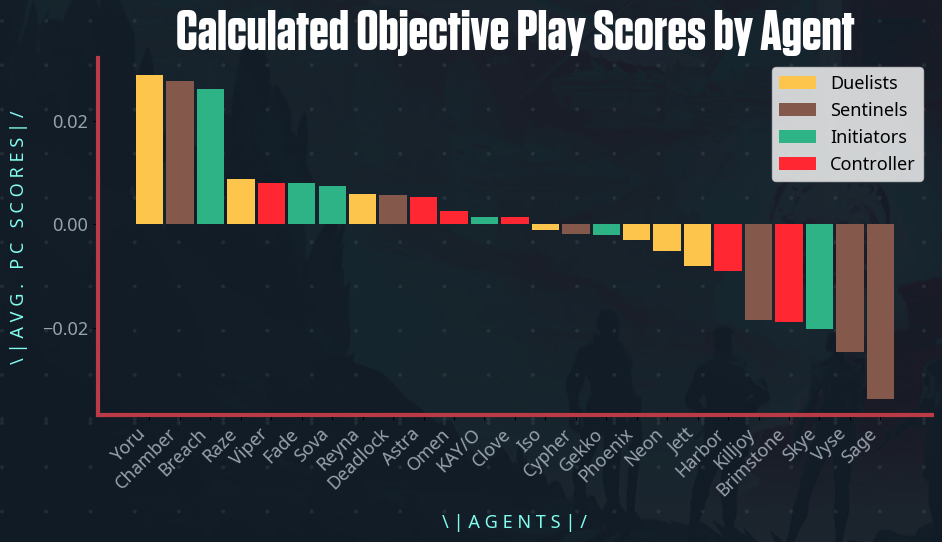

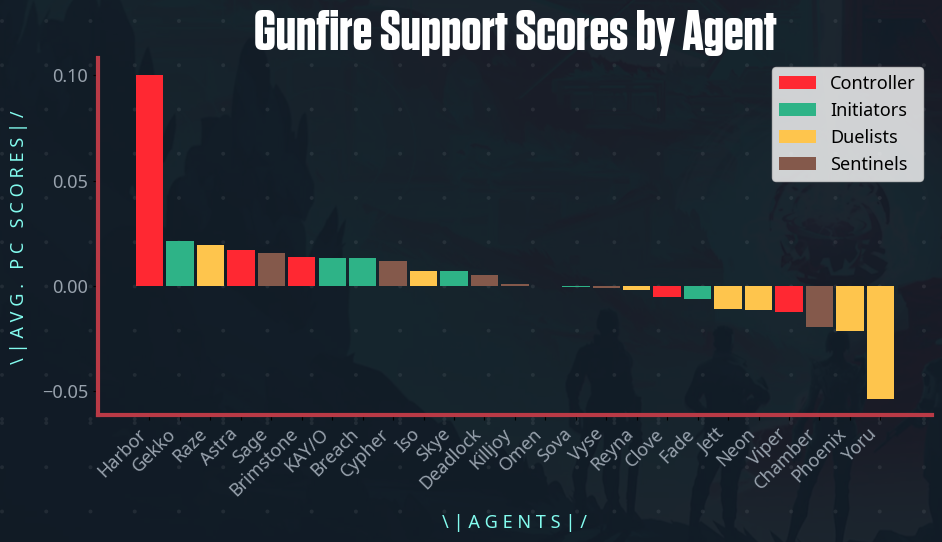

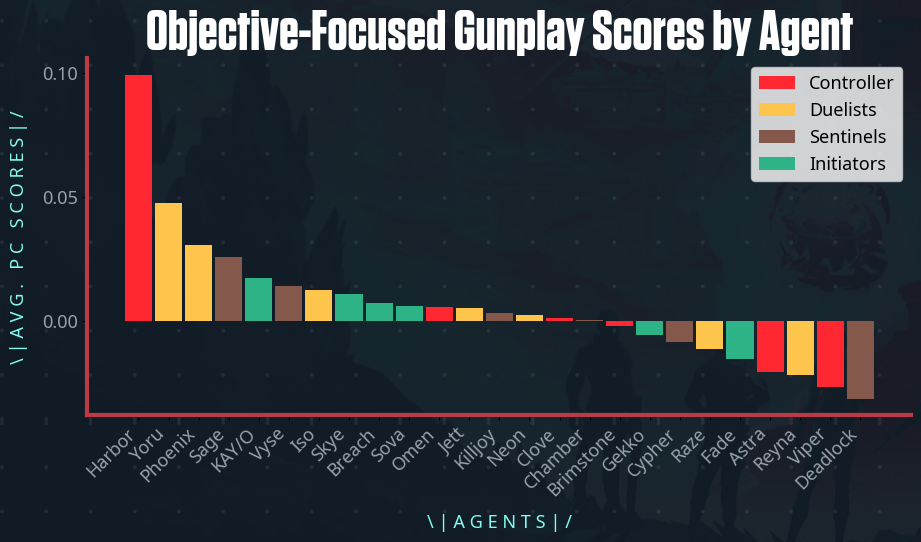

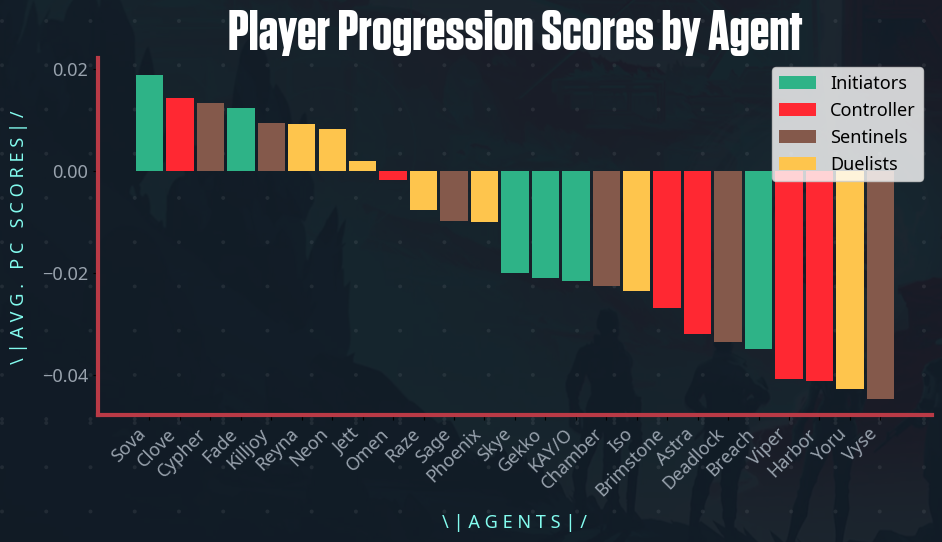

,PC: Combat Prowess,PC: Fragility Factor,PC: Utility-Based Teamwork,PC: Ability Focus,PC: Calculated Objective Play,PC: Gunfire Support,PC: Objective-Focused Gunplay,PC: Player Progression
agent_name,,,,,,,,
Harbor,0.119223,0.008753,-0.022248,0.083716,-0.009117,0.100257,0.099443,-0.041183
KAY/O,0.082773,0.016165,0.004577,-0.010953,0.001318,0.013312,0.017406,-0.021521
Vyse,0.065340,-0.053391,-0.002098,0.041131,-0.024607,-0.000834,0.013922,-0.044677
Omen,0.062761,-0.044728,0.030056,-0.017093,0.002473,-0.000211,0.005385,-0.001723
Phoenix,0.060698,0.003024,0.013311,-0.024328,-0.003115,-0.021523,0.030700,-0.009930
Deadlock,0.059441,-0.024325,0.049803,0.011754,0.005634,0.005308,-0.031596,-0.033490
Astra,0.043732,-0.014993,0.000772,-0.013964,0.005227,0.017052,-0.020688,-0.031989
Chamber,0.024384,0.006783,0.001208,-0.027626,0.027698,-0.019477,0.000111,-0.022568
Reyna,0.011436,-0.007292,0.006438,-0.005961,0.005868,-0.001999,-0.021990,0.009222


In [30]:
# Create the plots for PC scores by agent per PC ang get the tops and bottoms
all_pc_rankings = pd.DataFrame()

for i in range(1, num_pc+1):
    img = mpimg.imread("assets/wide_background.png")

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_facecolor((0,0,0,0))
    fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

    ax.spines['top'].set_color('#ba3a46')
    ax.spines['top'].set_alpha(0)
    ax.spines['bottom'].set_color('#ba3a46')
    ax.spines['bottom'].set_linewidth(3)
    ax.spines['left'].set_color('#ba3a46')
    ax.spines['left'].set_linewidth(3)
    ax.spines['right'].set_color('#ba3a46')
    ax.spines['right'].set_linewidth(0)

    pc_scores = X_pca_final[:, i - 1]
    loadings_df = pd.DataFrame({
        'agent_name': df2['agent_name'],
        'pc_scores': pc_scores,
        'agent_role': df2['agent_role']
    })

    avg_pc_scores = loadings_df.groupby('agent_name')['pc_scores'].mean()
    avg_pc_scores = avg_pc_scores.sort_values(ascending=False)

    
    agent_categories = [agent_roles[agent_dict[agent]] for agent in avg_pc_scores.index]
    agent_colors = [agent_color[agent] for agent in agent_categories]

    bars = plt.bar(avg_pc_scores.index, avg_pc_scores.values, color=agent_colors,width=0.9)


    category_legend = {}
    for bar, category in zip(bars, agent_categories):
        x, y = bar.get_x(), bar.get_height()
        if category not in category_legend:
            category_legend[category] = bar.set_label(category)


    plt.xlabel(' '.join('\|Agents|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    plt.ylabel(' '.join('\|Avg. PC Scores|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

    plt.title(f'{pc_names[i]} Scores by Agent', fontproperties=custom_font, color='white')

    plt.yticks(fontproperties=axis_labels_font, color='#98A2AD',)
    plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.legend(prop=axis_labels_font,loc='upper right')
    plt.show()

    

    all_pc_rankings[f'PC: {pc_names[i]}'] = avg_pc_scores


display(all_pc_rankings)

In [31]:
all_pc_rankings.to_csv(OUTPUT_DIR + 'all_pc_rankings.csv')

Some analyses:
- Combat Prowess

  - Duelists, a Controller, and a Sentinel Lead Combat Prowess. It's interesting to see that alongside the expected Duelists (red), Viper (blue), a Controller, and Vyse (orange), a Sentinel, take the first and second spots in the ranking. This suggests that players are effectively utilizing their kits for aggressive plays and securing kills, potentially challenging the conventional notion of Controllers and Sentinels being purely focused on utility, map control, and defensive strategies.
  -  Skye (green), an Initiator, also secures a high position. This highlights how Initiators can contribute significantly to combat by setting up opportunities for their team to engage and eliminate enemies.

- Fragility Factor
  - Viper, Yoru, Skye, and Raze are also at the top of PC2 scores about the vulnerability to damage and even death. Pairing this with the findings in PC1 (Combat Prowess), it can be surmised that these characters are often played aggressively and are always on the frontlines.

- Utility-based Teamwork
  - Sentinels, Controllers, and Initiators are expected to be seen in this PC given their supportive skills and ability to work with teammates to carry out the spike objective.
  - Killjoy, Astra, Gekko, Cypher leads here given their special abilities to gather and provide information for teammates to successfully plant or defuse the spike.

- Ability Focus
  - A different set of Sentinels, Controllers and Initiators lead in PC scores for Ability Focus. These plays are often a gambit between ability usage alone compared to the traditional gameplay.
  - Vyse, KAY/O, Skye, and Deadlock are agents that get used for their ability casting rather than gunplay, often with a losing probability.

- Calculated Objective Play
  - Sentinels and Controllers perform best here. The plays made by these support agents can make or break winning the round by succesfully planting or defusing the spike.
  - Killjoy, Viper, Chamber, Sage, and even Harbor can set up the playing field for a successful plant or defuse in a game.

- Gunfire Support
  - Deadlock, a Sentinel, and Yoru, a Duelist, leading the pack in "Gunfire Support." This suggests that players using these agents are effectively leveraging their kits to provide consistent damage and assists, even though their roles aren't typically associated with this playstyle.
  - Breach, another high-scoring agent, is an Initiator, further reinforcing the idea that this role can contribute significantly to team fights through disruption and creating opportunities for teammates to deal damage.
  - Clove, Brimstone, Harbor, Skye, and Sage stand out with particularly low scores, reinforcing their focus on abilities and strategic play rather than consistent damage output and assist generation.

- Objective-Focused Gunplay
  - It's intriguing to see Controllers (blue) like Harbor and Viper leading the pack, alongside Initiators (green) like Gekko and KAY/O. This suggests that these agents, often associated with utility and map control or initiating engagements, are also adept at using their weapons to create opportunities for planting or defusing the Spike.
  - Phoenix, a Duelist (red), also scores high, indicating that some Duelists can effectively combine their aggressive gunplay with objective-focused actions.
  - Deadlock, Astra, Fade, Cypher, and Raze stand out with particularly low scores, reinforcing their focus on other aspects of the game, such as locking down areas, gathering information, or securing kills.
  - While "Gunfire Support" focuses on providing consistent damage and assists during engagements, "Objective-Focused Gunplay" emphasizes using gunplay specifically to enable planting or defusing the Spike. This distinction is evident in the different agents that excel in each PC. For example, Deadlock and Yoru score high in "Gunfire Support" but relatively lower in "Objective-Focused Gunplay," while Harbor and Gekko show the opposite trend.

- Player Progression
  - The plot suggests that certain agents, like Viper, Yoru, Harbor, Killjoy, and Deadlock, might be more popular among experienced and higher-ranked players. However, it's important to note the diversity of roles among these agents, indicating that player progression is not limited to a specific role preference.
  - This hints at the possibility of playstyle evolution as players progress in Valorant, with potential shifts in agent preferences and a focus on different aspects of the game.
  

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/803468924.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/803468924.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/803468924.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886

,Map,PC: Combat Prowess,PC: Fragility Factor,PC: Utility-Based Teamwork,PC: Ability Focus,PC: Calculated Objective Play,PC: Gunfire Support,PC: Objective-Focused Gunplay,PC: Player Progression
0,Abyss,-0.023953,-0.025736,0.006514,0.004496,0.008677,0.003102,-0.005421,0.015084
1,Ascent,0.053140,0.019643,0.016812,-0.002760,-0.006125,-0.010199,-0.006659,0.009229
2,Bind,-0.021157,0.004280,-0.001501,0.006252,-0.003269,0.011526,0.008394,-0.008783
3,Haven,0.004785,0.006270,-0.008335,-0.003948,0.006503,0.000432,0.005628,0.006301
4,Pearl,-0.007387,-0.013063,-0.004880,0.006658,-0.004325,-0.014557,-0.003243,-0.004612
5,Split,-0.020931,-0.011857,-0.014366,-0.002342,0.006313,0.009055,0.002554,0.005575
6,Sunset,0.001993,0.007801,0.008700,-0.003542,-0.002963,-0.000019,-0.011119,-0.009353


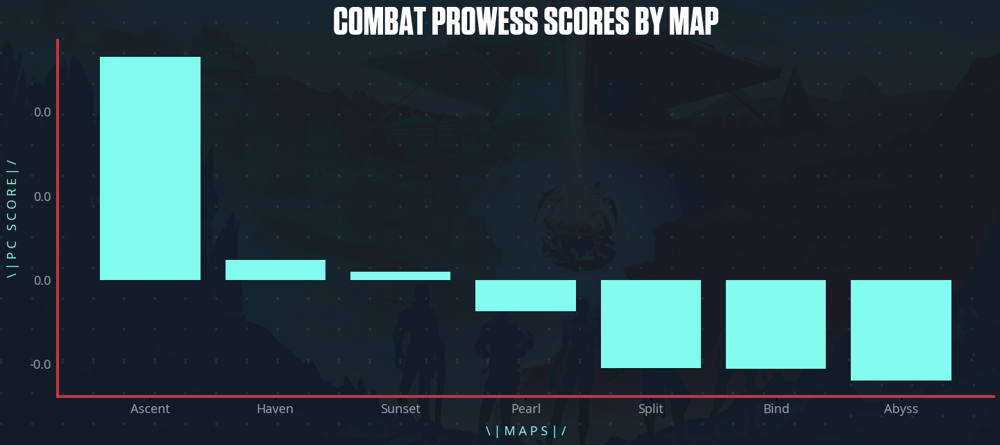

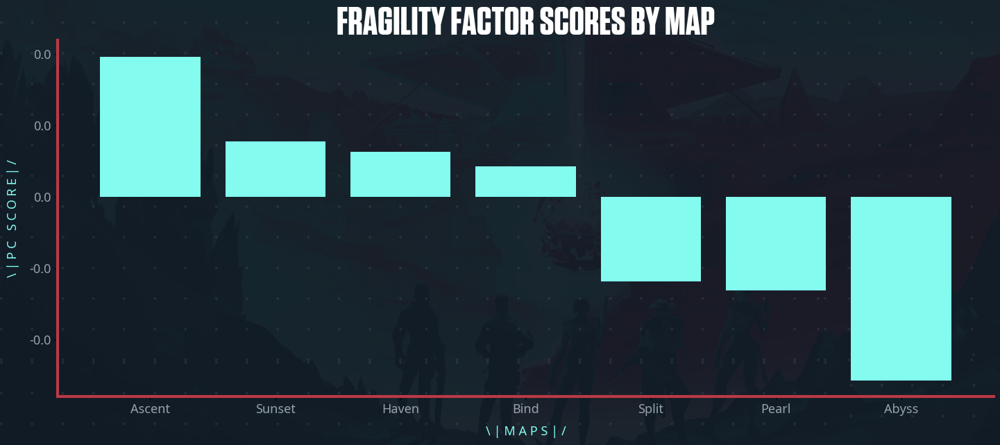

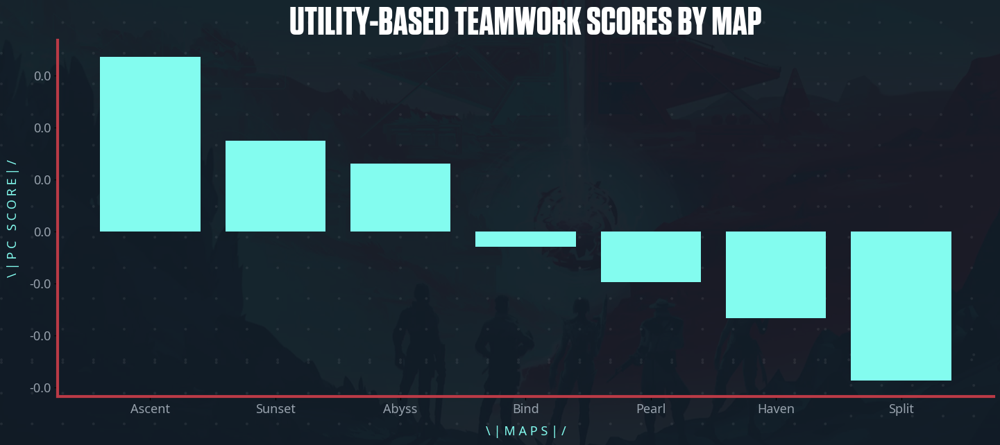

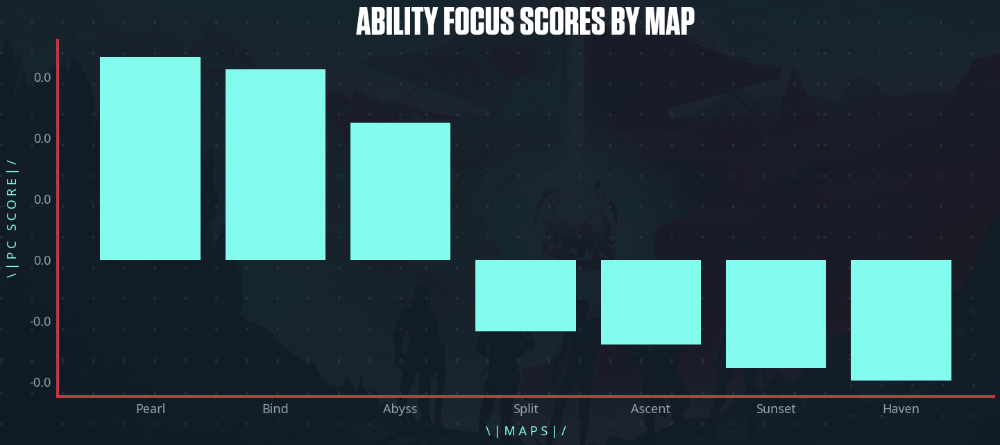

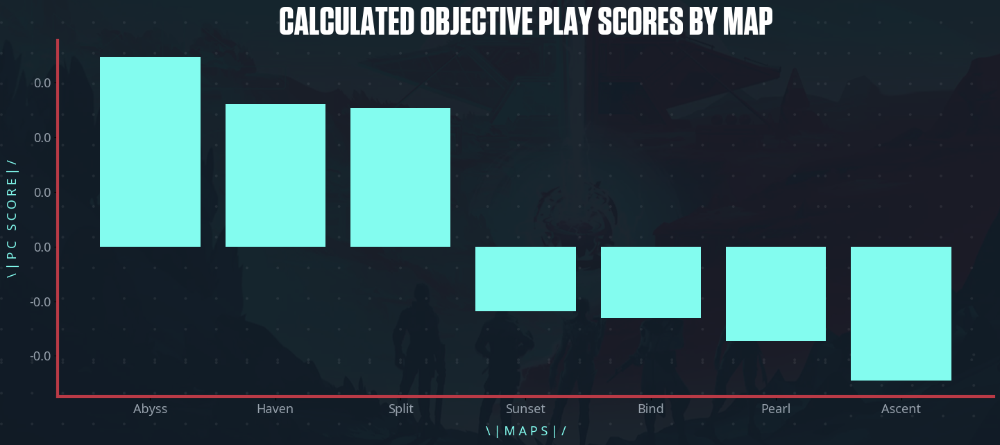

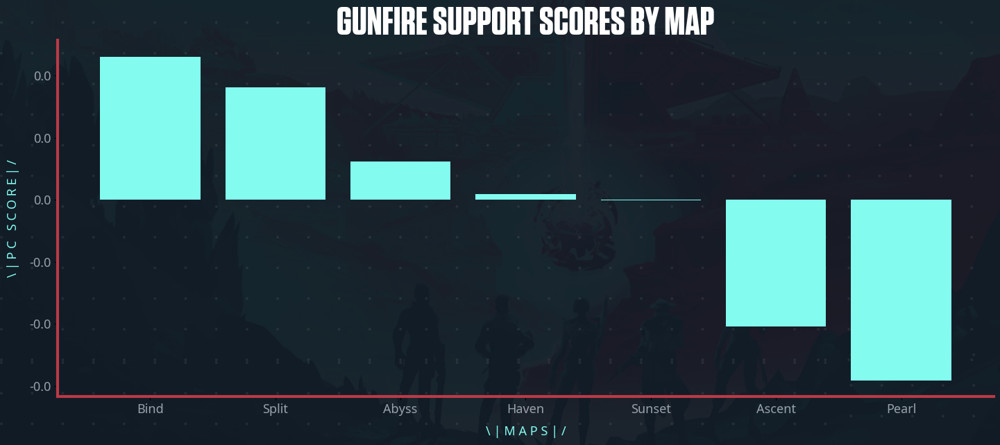

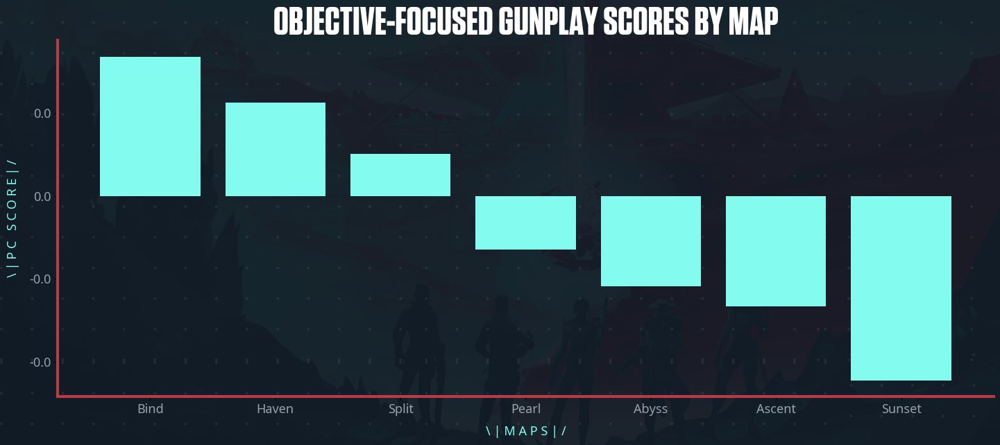

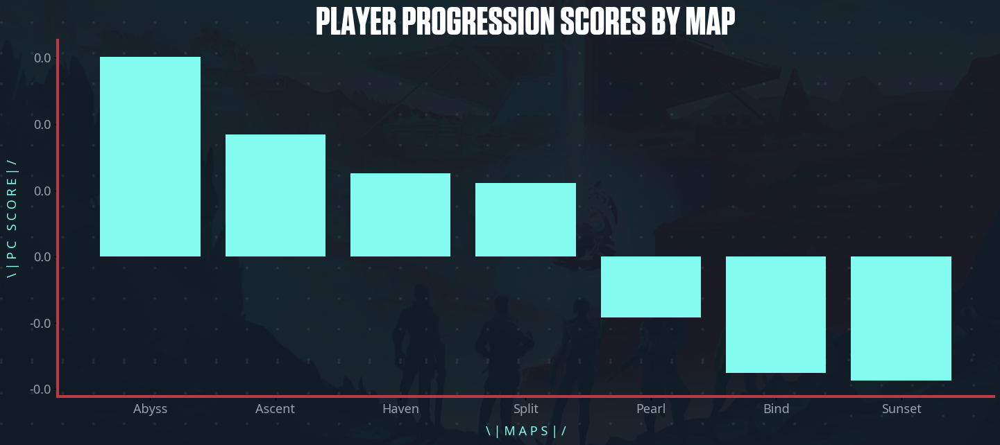

In [32]:
# Create the plots for PC scores by map per PC
map_pc_rankings = pd.DataFrame()

for i in range(1, num_pc + 1):
    img = mpimg.imread("assets/wide_background.png")

    fig, ax = plt.subplots(figsize=(15, 7))
    ax.set_facecolor((0,0,0,0))
    fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)

    ax.spines['top'].set_color('#ba3a46')
    ax.spines['top'].set_alpha(0)
    ax.spines['bottom'].set_color('#ba3a46')
    ax.spines['bottom'].set_linewidth(3)
    ax.spines['left'].set_color('#ba3a46')
    ax.spines['left'].set_linewidth(3)
    ax.spines['right'].set_color('#ba3a46')
    ax.spines['right'].set_linewidth(0)

    pc_scores = X_pca_final[:, i - 1]
    loadings_df = pd.DataFrame({
        'map_name': df2['map_name'],
        'pc_scores': pc_scores
    })

    

    # Filter out unwanted maps
    filtered_loadings_df = loadings_df[~loadings_df['map_name'].isin(['Lotus', 'Breeze', 'Icebox', 'Fracture'])]

    avg_pc_scores = filtered_loadings_df.groupby('map_name')['pc_scores'].mean()
    avg_pc_scores = avg_pc_scores.sort_values(ascending=False)

    plt.bar(avg_pc_scores.index, avg_pc_scores.values, color='#83FCEF')


    plt.xlabel(' '.join('\|Maps|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    plt.ylabel(' '.join('\|PC Score|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    
    plt.title(f'{pc_names[i]} scores by Map'.upper(), fontproperties=custom_font, color='white')

    plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )

    ax.set_yticklabels(ax.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
    plt.tight_layout()

    pc_map_rankings = avg_pc_scores.reset_index().rename(columns={'map_name': 'Map', 'pc_scores': f'PC: {pc_names[i]}'})

    if map_pc_rankings.empty:
        map_pc_rankings = pc_map_rankings
    else:
        map_pc_rankings = pd.merge(map_pc_rankings, pc_map_rankings, on='Map', how='outer')

display(map_pc_rankings)

Ability Focus





Some analyses:
- Combat Prowess (PC1), Fragility Factor(PC2) and Utility-based Teamwork(PC3)

  - The map Bind encourages aggressive gameplay, offering a high-risk, high-reward environment with both high kill potential and vulnerability.  Surprisingly, even agents typically focused on support find success pushing forward and securing kills, utilizing the map's teleportation portal and their abilities for creative plays and Spike plants.  This aggressive atmosphere, combined with Bind's tight spaces, demands coordinated teamwork and clever ability usage for success.  In contrast, Haven, with its three bomb sites, necessitates a more spread-out approach, making coordinated pushes more complex. This often leads to individual plays and gunfights taking priority over teamwork and utility usage.

- Ability Focus(PC4), Calculated Objective Play(PC5) and Gunfire Support(PC6)

  - Pearl offers a balanced layout with two Spike sites and three lanes, prioritizing tactical gameplay over gimmicks like teleporters and rotating doors, which aligns with the need for "Calculated Objective Play."  Its blend of open spaces and narrow corridors encourages diverse combat engagements, rewarding precise aiming and contributing to a higher "Ability Focus" and "Gunfire Support". As Pearl's layout provides many opportunities for combat, it has a high correlation on PCs that highlight the strategic use of abilities and firearms in order to successfully plant or defuse at the two Spike sites.


- Objective-Focused Gunplay(PC7)

  - The open mid areas on Pearl and Sunset reward precise gunplay and aggressive pushes, making winning duels crucial for map control and, ultimately, victory. Players who can consistently secure these advantageous positions gain an edge when planting or defusing the Spike, as these maps favor precise aiming and quick reflexes. In contrast, Bind, with its tighter spaces, requires a more strategic and coordinated approach, prioritizing teamwork and ability usage to navigate the map and secure objectives.

- Player Progression(PC8)

  - Although map picks are randomized in Valorant, the chart reveals interesting trends in "Player Progression" across different maps, potentially influenced by map familiarity and age. Ascent and Split were among the early maps released, suggesting experienced players might be more familiar with their layouts and strategic possibilities. In contrast, Abyss, Pearl, and Sunset are newer additions, where players are still learning the nuances and haven't fully explored the strategic depth found in older maps. Bind and Haven seem to host a balanced mix of experience levels, catering to both newer and veteran players. This analysis suggests that map preference and performance could be linked to player progression, with certain maps potentially serving as indicators of deeper strategic understanding.

In [33]:
map_pc_rankings.to_csv(OUTPUT_DIR + 'map_pc_rankings.csv')

#Cluster Analysis

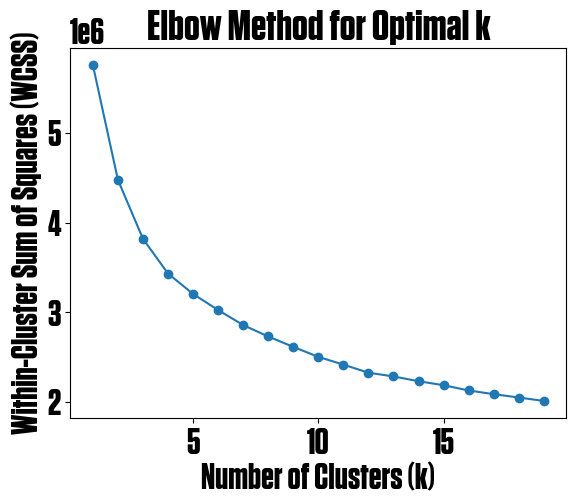

In [34]:
# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_pca_final)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 20), wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.show()


In [35]:
optimal_k = 6

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(X_pca_final)

df2['cluster'] = clusters

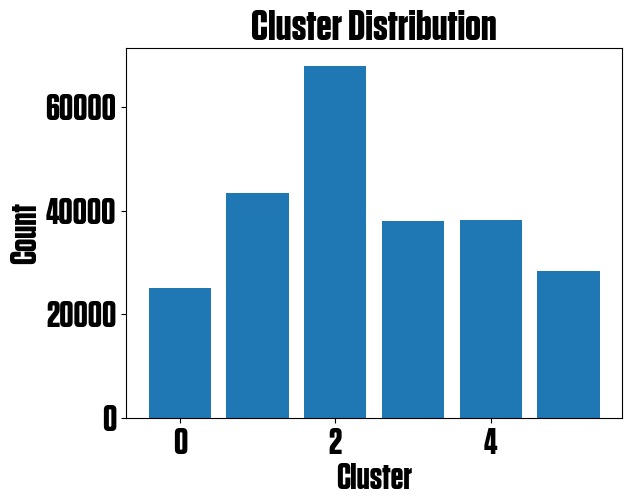

In [36]:
#Check cluster distribution
cluster_counts = df2['cluster'].value_counts().sort_index()

clusters = cluster_counts.index.tolist()
counts = cluster_counts.values.tolist()

plt.bar(clusters, counts)
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Cluster Distribution')
plt.show()

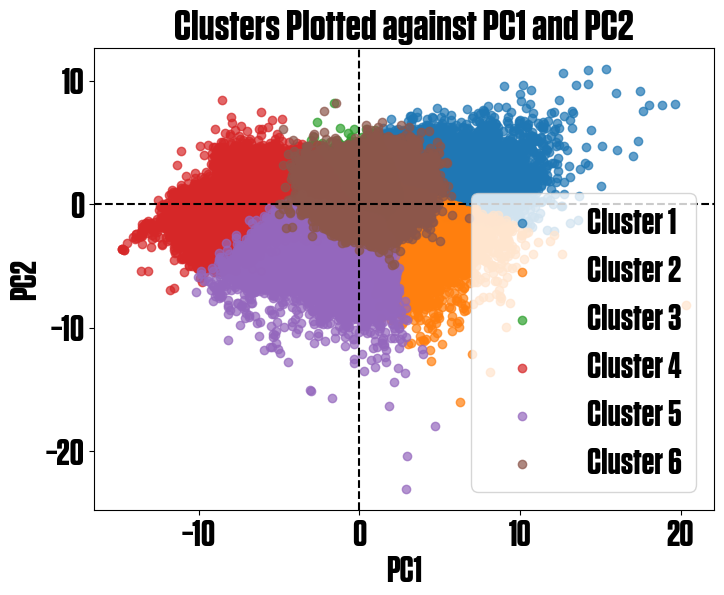

In [37]:
#Plot clusters against PC1 and PC2
unique_clusters = np.unique(df2['cluster'])
num_clusters = len(unique_clusters)



plt.figure(figsize=(8, 6))
for cluster in unique_clusters:
    cluster_data = df2[df2['cluster'] == cluster]
    plt.scatter(cluster_data['PC1'], cluster_data['PC2'], label=f'Cluster {cluster+1}', alpha=0.7)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clusters Plotted against PC1 and PC2')
plt.axhline(y=0, color='k', linestyle='--')
plt.axvline(x=0, color='k', linestyle='--')
plt.legend()
plt.show()

In [38]:
# A series of of one-way ANOVAs to check that the PCs are statistically and significantly different per cluster.

principal_components = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8']

anova_results_pcs = {}

for pc in principal_components:
    model = sm.ols(f'{pc} ~ C(cluster)', data=df2).fit()
    anova_table = anova_lm(model, typ=2)
    p_value = anova_table['PR(>F)'].iloc[0]
    anova_results_pcs[pc] = p_value

print("ANOVA Results for Principal Components:")
for pc, p_val in anova_results_pcs.items():
    print(f"{pc}: p-value = {p_val}")

ANOVA Results for Principal Components:
PC1: p-value = 0.0
PC2: p-value = 0.0
PC3: p-value = 0.0
PC4: p-value = 0.0
PC5: p-value = 0.0
PC6: p-value = 0.0
PC7: p-value = 0.0
PC8: p-value = 2.6130318658879806e-119


In [39]:
cluster_pc_scores = df2.groupby('cluster')[[f'PC{i}' for i in range(1, 9)]].mean()
cluster_pc_scores = cluster_pc_scores.rename(columns={f'PC{i}': pc_names[i] for i in range(1, 9)})
display(cluster_pc_scores)


,Combat Prowess,Fragility Factor,Utility-Based Teamwork,Ability Focus,Calculated Objective Play,Gunfire Support,Objective-Focused Gunplay,Player Progression
cluster,,,,,,,,
0,4.408381,1.956011,0.128304,-0.152589,-0.398316,0.166977,-0.021643,-0.079581
1,2.613365,-1.527838,-1.042240,0.159770,0.288149,0.015197,0.065290,-0.044850
2,-0.297098,1.012916,-0.232464,0.155888,-0.635282,0.034159,-0.106271,-0.012434
3,-4.373786,1.103791,-1.145830,0.202563,0.656438,0.085067,-0.004189,0.000142
4,-1.286620,-3.170634,1.132531,-0.230804,-0.640004,0.142916,-0.117481,0.071133
5,0.412570,0.972336,2.053416,-0.445120,1.419813,-0.560184,0.338580,0.072932


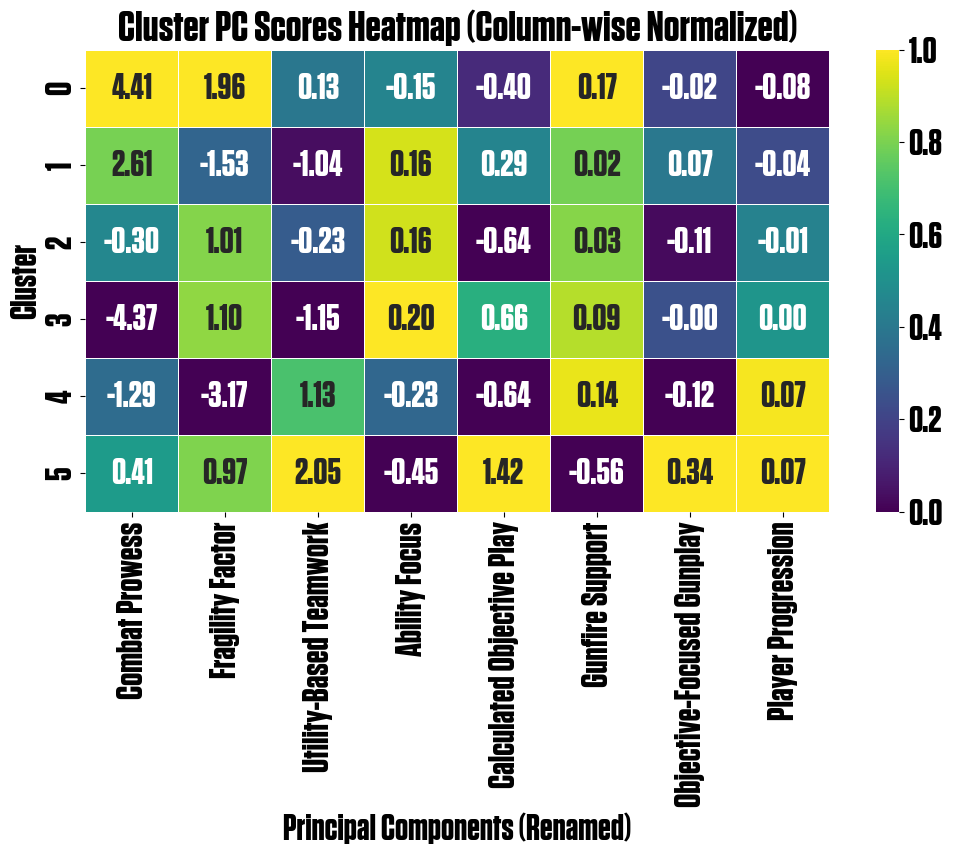

In [40]:
cluster_pc_scores = df2.groupby('cluster')[[f'PC{i}' for i in range(1, 9)]].mean()
cluster_pc_scores = cluster_pc_scores.rename(columns={f'PC{i}': pc_names[i] for i in range(1, 9)})

# Create the heatmap
cluster_pc_scores = df2.groupby('cluster')[[f'PC{i}' for i in range(1, 9)]].mean()
cluster_pc_scores = cluster_pc_scores.rename(columns={f'PC{i}': pc_names[i] for i in range(1, 9)})

# Normalize data column-wise
cluster_pc_scores_normalized = cluster_pc_scores.apply(lambda x: (x - x.min()) / (x.max() - x.min()))

# Create the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_pc_scores_normalized, annot=cluster_pc_scores, cmap='viridis', fmt=".2f", linewidths=.5)
plt.title('Cluster PC Scores Heatmap (Column-wise Normalized)')
plt.xlabel('Principal Components (Renamed)')
plt.ylabel('Cluster')
plt.show()

In [41]:
cluster_pc_scores.to_csv(OUTPUT_DIR + 'cluster_pc_scores.csv')

## For Presentation Only

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


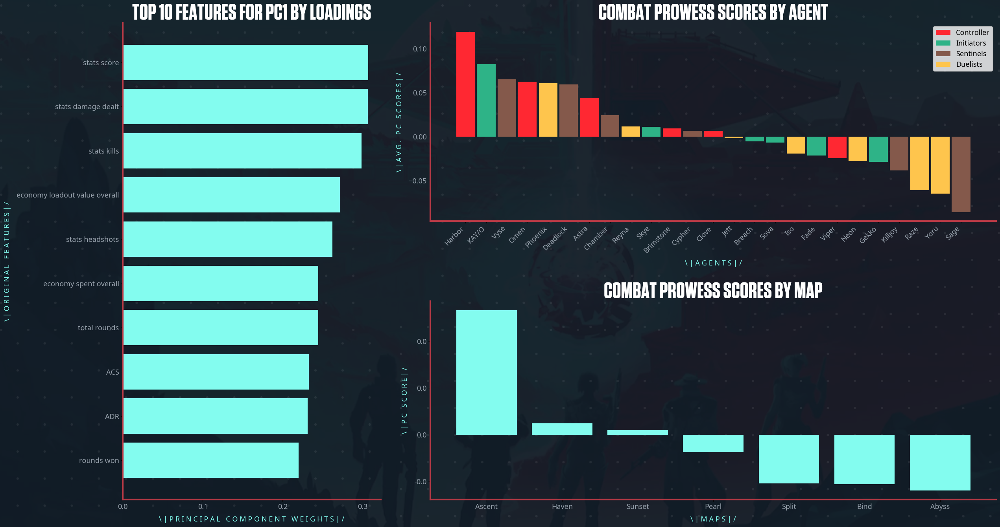

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


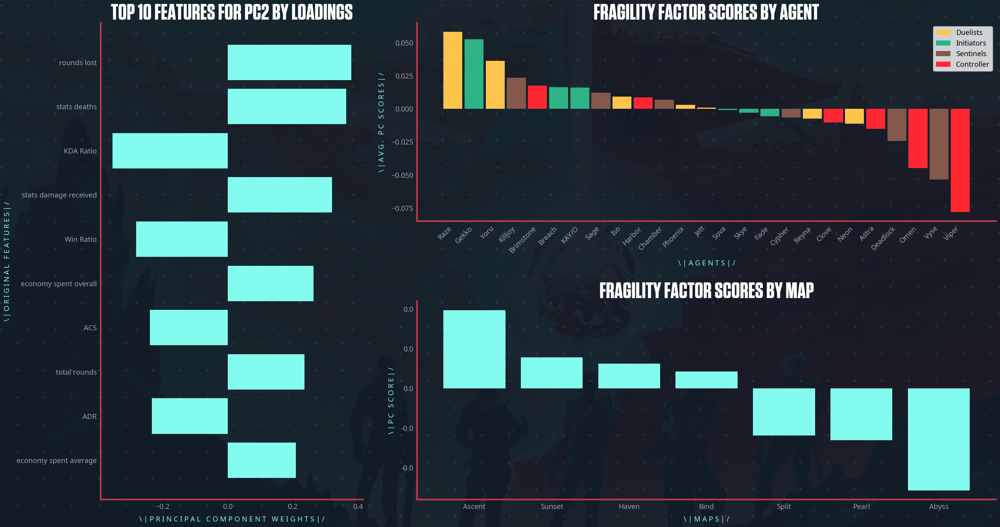

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


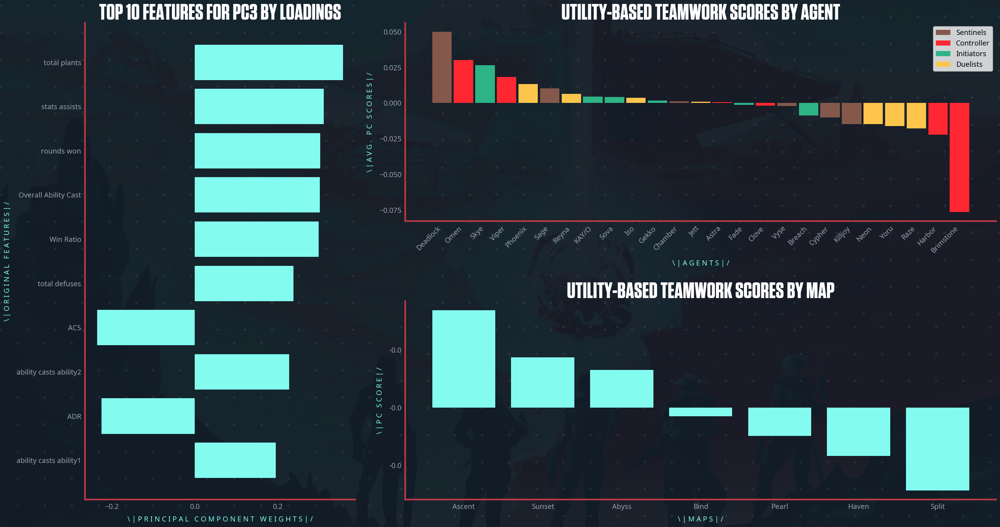

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


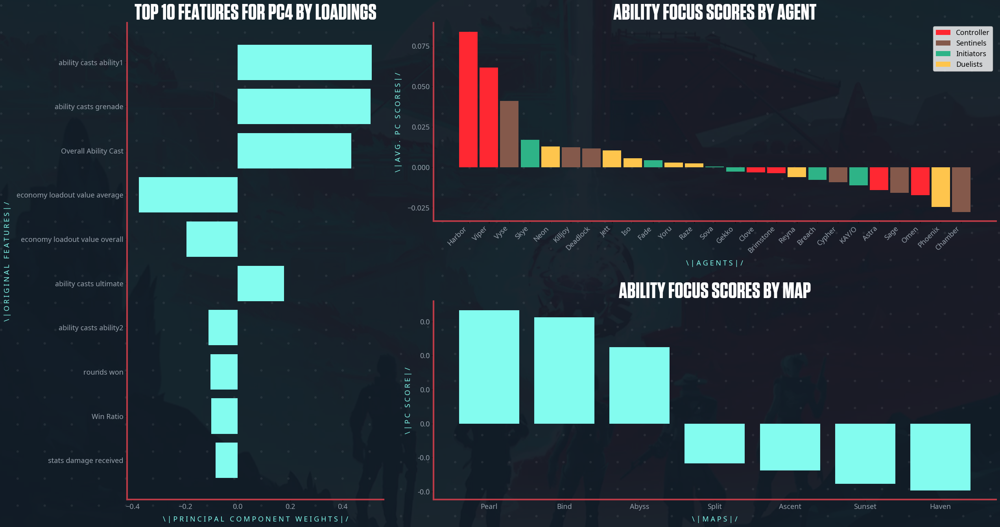

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


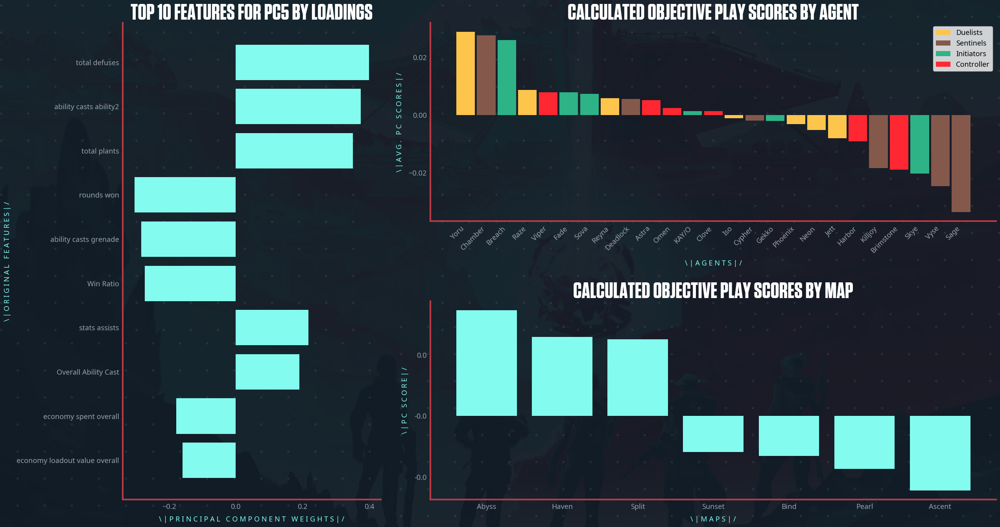

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


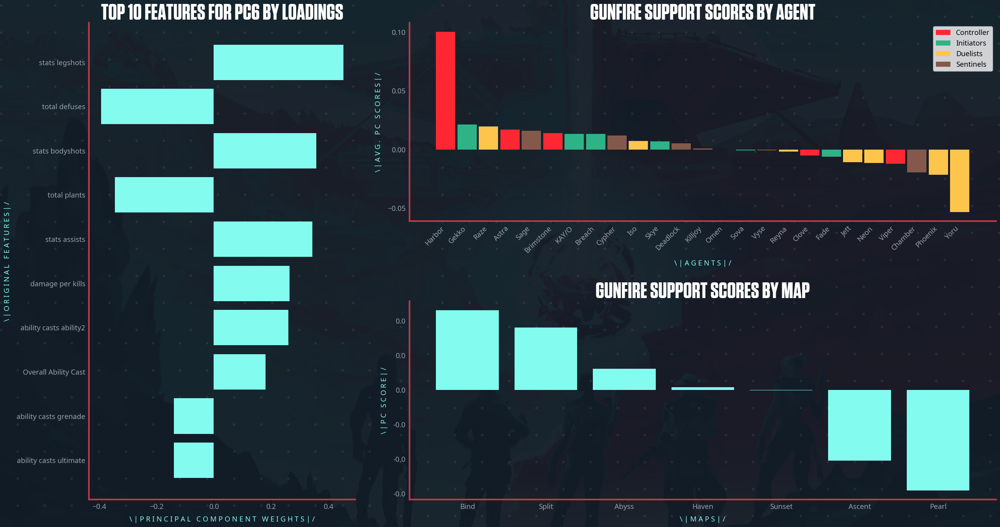

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


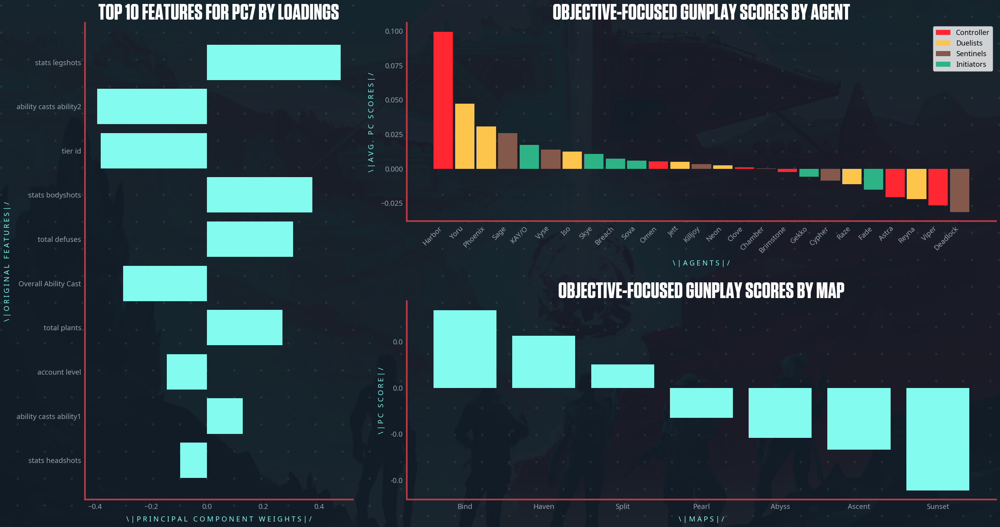

/var/folders/94/qqxkptrd1bg66t_3104htv1m0000gn/T/ipykernel_81886/4243798921.py:122: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)


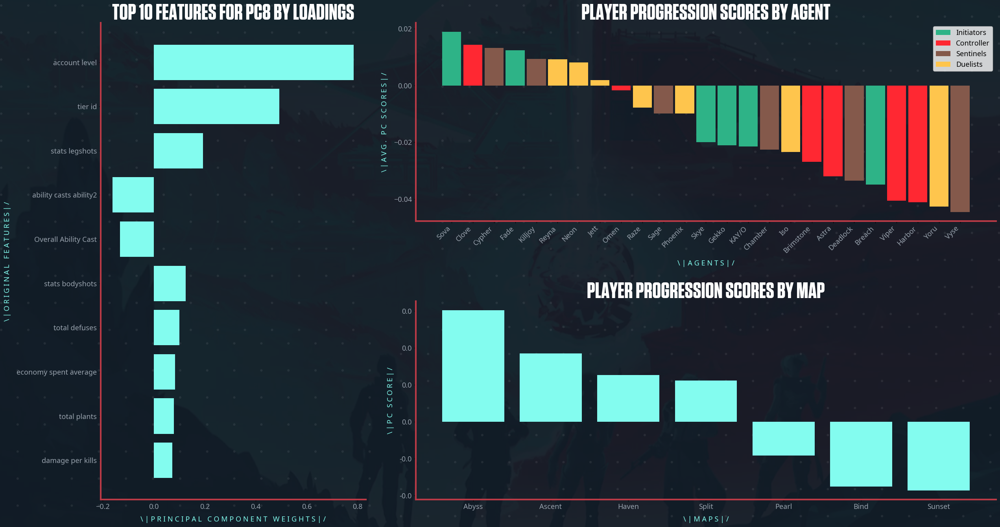

In [42]:
for i in range(1, num_pc + 1):
    img = mpimg.imread("assets/full_background.png")

    fig = plt.figure(figsize=(26,14))
    fig.figimage(img, xo=0, yo=0, alpha=1, zorder=-1,)
    # ax.set_facecolor((0,0,0,0))

    gs = fig.add_gridspec(2,3)

    ax1 = fig.add_subplot(gs[:, 0])
    ax1.set_facecolor((0,0,0,0))

    ax1.spines['top'].set_color('#ba3a46')
    ax1.spines['top'].set_alpha(0)
    ax1.spines['bottom'].set_color('#ba3a46')
    ax1.spines['bottom'].set_linewidth(3)
    ax1.spines['left'].set_color('#ba3a46')
    ax1.spines['left'].set_linewidth(3)
    ax1.spines['right'].set_color('#ba3a46')
    ax1.spines['right'].set_linewidth(0)

    loadings = pca_final.components_[i - 1]
    sorted_indices = np.argsort(np.abs(loadings))[-10:]
    sorted_loadings = loadings[sorted_indices]
    sorted_feature_names = feature_names[sorted_indices]

    sorted_feature_names = [ name.replace('_',' ') for name in sorted_feature_names]

    ax1.barh(sorted_feature_names, sorted_loadings, color='#83FCEF')
    plt.xlabel(' '.join('\|Principal Component Weights|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    plt.ylabel(' '.join('\|Original Features|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

    plt.title(f'Top {len(sorted_feature_names)} Features for PC{i} by loadings'.upper(), fontproperties=custom_font, color='white')

    plt.yticks(fontproperties=axis_labels_font, color='#98A2AD',)
    plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )


    ax2 = fig.add_subplot(gs[0, 1:])
    ax2.set_facecolor((0,0,0,0))


    ax2.spines['top'].set_color('#ba3a46')
    ax2.spines['top'].set_alpha(0)
    ax2.spines['bottom'].set_color('#ba3a46')
    ax2.spines['bottom'].set_linewidth(3)
    ax2.spines['left'].set_color('#ba3a46')
    ax2.spines['left'].set_linewidth(3)
    ax2.spines['right'].set_color('#ba3a46')
    ax2.spines['right'].set_linewidth(0)

    pc_scores = X_pca_final[:, i - 1]
    loadings_df = pd.DataFrame({
        'agent_name': df2['agent_name'],
        'pc_scores': pc_scores,
        'agent_role': df2['agent_role']
    })

    avg_pc_scores = loadings_df.groupby('agent_name')['pc_scores'].mean()
    avg_pc_scores = avg_pc_scores.sort_values(ascending=False)

    
    agent_categories = [agent_roles[agent_dict[agent]] for agent in avg_pc_scores.index]
    agent_colors = [agent_color[agent] for agent in agent_categories]

    bars = plt.bar(avg_pc_scores.index, avg_pc_scores.values, color=agent_colors,width=0.9)


    category_legend = {}
    for bar, category in zip(bars, agent_categories):
        x, y = bar.get_x(), bar.get_height()
        if category not in category_legend:
            category_legend[category] = bar.set_label(category)


    plt.xlabel(' '.join('\|Agents|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    plt.ylabel(' '.join('\|Avg. PC Scores|/').upper(), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)

    plt.title(f'{pc_names[i]} Scores by Agent'.upper(), fontproperties=custom_font, color='white')

    plt.yticks(fontproperties=axis_labels_font, color='#98A2AD',)
    plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.legend(prop=axis_labels_font,loc='upper right')

    ax3 = fig.add_subplot(gs[1, 1:])
    ax3.set_facecolor((0,0,0,0))

    ax3.spines['top'].set_color('#ba3a46')
    ax3.spines['top'].set_alpha(0)
    ax3.spines['bottom'].set_color('#ba3a46')
    ax3.spines['bottom'].set_linewidth(3)
    ax3.spines['left'].set_color('#ba3a46')
    ax3.spines['left'].set_linewidth(3)
    ax3.spines['right'].set_color('#ba3a46')
    ax3.spines['right'].set_linewidth(0)

    pc_scores = X_pca_final[:, i - 1]
    loadings_df = pd.DataFrame({
        'map_name': df2['map_name'],
        'pc_scores': pc_scores
    })

    # Filter out unwanted maps
    filtered_loadings_df = loadings_df[~loadings_df['map_name'].isin(['Lotus', 'Breeze', 'Icebox', 'Fracture'])]

    avg_pc_scores = filtered_loadings_df.groupby('map_name')['pc_scores'].mean()
    avg_pc_scores = avg_pc_scores.sort_values(ascending=False)

    plt.bar(avg_pc_scores.index, avg_pc_scores.values, color='#83FCEF')


    plt.xlabel(' '.join('\|Maps|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    plt.ylabel(' '.join('\|PC Score|/'.upper()), fontproperties=axis_labels_font,color='#83FCEF', labelpad=10)
    
    plt.title(f'{pc_names[i]} scores by Map'.upper(), fontproperties=custom_font, color='white')

    plt.xticks(rotation=0, ha='center', fontproperties=axis_labels_font, color='#98A2AD', )

    ax3.set_yticklabels(ax3.get_yticks().round(1)*100, fontproperties=axis_labels_font, color='#98A2AD',)
    plt.tight_layout()

    plt.show()

    